# Neural Decoding

Neural protheses offer the potential to substantially increase the quality of life for people sufferring from motor disorders to regain the ability to move or communicate. A key component within these devices is the neural decoder, which translate electrical neural activity from the brain into control signals for guiding paralyzed upper limbs, prosthetic arms, and computer cursors.

After assessing how each neuron responds both before and during a movement, neural decoding algorithms can be devised to decode the desired movement trajectory (continuous decoder) or movement target (discrete decoder) based on the pattern of neural activity. Taking arm-reaching movements as an example, the continuous decoder can produce a continuous control signal to guide a paralyzed or prosthetic arm through space (e.g., reaching for a cup), while the discrete decoder can position a computer cursor at the desired location on the screen (e.g., typing via the keyboard).

# Tutorial Objectives
Estimated timing of tutorial: 2 hours

This is the second of two core tutorials on the Neural Decoder. In the earlier interactive coding session, you were introduced to the neural decoder and several star datasets. In this tutorial, we will demonstrate neural decoder training and testing using the MC_Maze dataset and introduce you to various neural decoding challenges. For your Hackathon project, you can attempt to apply the decoding techniques introduced here to new datasets or take on one of the decoding challenges to enhance the performance of the neural decoder.

This notebook will introduce the fundamental building blocks for both discrete and continuous Neural Decoder:


1.   Formulate deocding objective and requirement base on target application
2.   Solving continuous decoding problem with regression models (logistic regression and RNN regressor)
3.   Solving discrete decoding problem with classification models (bayesian classifier)
4.   Decoding Challenge: Train RNN classifier to classify the reach target


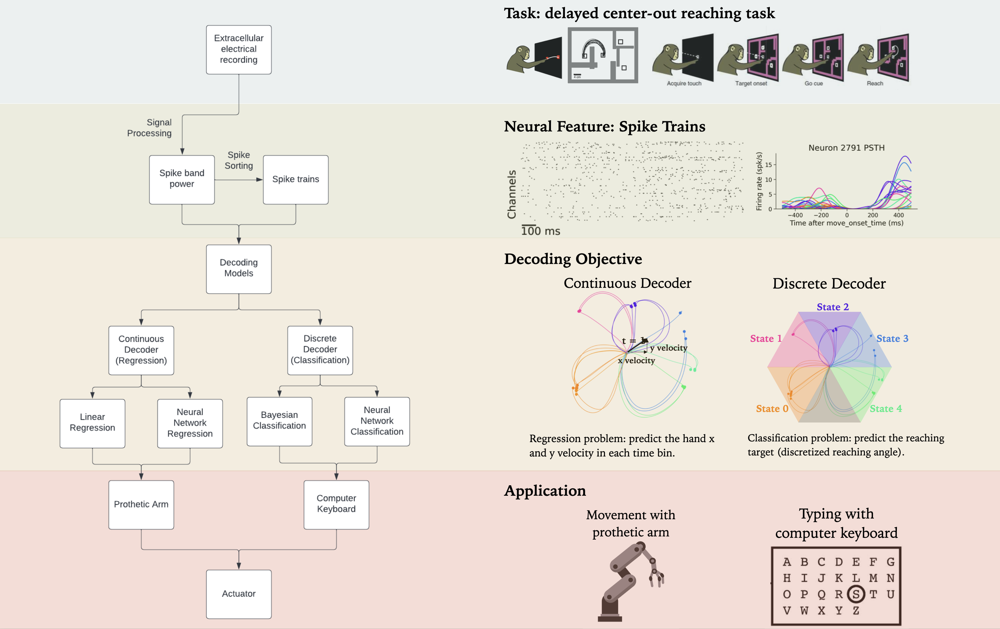

# Set Up

## Install


*   `dandi` | api for fetching publically shared dataset
*   `nlb_tools` | tool package to interact with dataset formatted with the NWB format


Note: Installation is required whenever colab refresh.



In [8]:
## Download dataset and required packages if necessary
!pip install git+https://github.com/neurallatents/nlb_tools.git
!pip install dandi
!dandi download https://gui.dandiarchive.org/#/dandiset/000139

  Cloning https://github.com/neurallatents/nlb_tools.git to /tmp/pip-req-build-nnp_f38k
  Running command git clone --filter=blob:none --quiet https://github.com/neurallatents/nlb_tools.git /tmp/pip-req-build-nnp_f38k
  Resolved https://github.com/neurallatents/nlb_tools.git to commit 75c5bf0401b84cf53fba9dc57449e3252d4acb88
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.5/11.5 MB 77.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.0/134.0 kB 14.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 329.8/329.8 kB 29.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 112.2/112.2 kB 12.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 485.6/485.6 kB 40.6 MB/s eta 0:00:00
  Created wheel for nlb_tools: filename=nlb_tools-0.0.2-py3-none-any.whl size=34376 sha256=42dc2e0691668f6677f90a2c8a94455fa2550de521

## Setting

In [3]:
# @title Imports

# %matplotlib widget # uncomment for interactive plots
from nlb_tools.nwb_interface import NWBDataset
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

In [4]:
# @title Figure Settings
import logging
logging.getLogger('matplotlib.font_manager').disabled = True

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import ipywidgets as widgets
from IPython.display import clear_output
from ipywidgets import FloatSlider, Dropdown, interactive_output
from ipywidgets import interact, fixed, HBox, Layout, VBox, interactive, Label
plt.style.use("https://raw.githubusercontent.com/NeuromatchAcademy/course-content/main/nma.mplstyle")

import warnings
warnings.filterwarnings("ignore")

## Plotting Functions
- `plot_continuous_decoder` |

In [5]:
def plot_continuous_decoder(data_align_range, bin_width, true_data, pred_data, color=['black', 'blue']):
    """
    Plot continuous decoder results.

    Args:
        data_align_range (tuple): The range of time in milliseconds for data alignment.
        bin_width (float): The bin width in milliseconds.
        true_data (numpy.ndarray): True data for comparison.
        pred_data (numpy.ndarray): Predicted data for comparison.
        color (list, optional): A list of colors for plotting (default: ['black', 'blue']).

    """
    nTrial, _, _ = np.shape(true_data)

    # Initialize figure
    fig, axs = plt.subplots(2, 3, figsize=(10, 4))
    t = np.arange(data_align_range[0], data_align_range[1], bin_width)

    # Loop through trials in condition
    for trial_i in range(nTrial):
        # True and predicted x velocity
        axs[0][0].plot(t, true_data[trial_i, :, 0], linewidth=0.7, color=color[0])
        axs[1][0].plot(t, pred_data[trial_i, :, 0], linewidth=0.7, color=color[1])
        # True and predicted y velocity
        axs[0][1].plot(t, true_data[trial_i, :, 1], linewidth=0.7, color=color[0])
        axs[1][1].plot(t, pred_data[trial_i, :, 1], linewidth=0.7, color=color[1])
        # True and predicted trajectories
        true_traj = np.cumsum(true_data[trial_i, :, :], axis=0) * bin_width / 1000
        pred_traj = np.cumsum(pred_data[trial_i, :, :], axis=0) * bin_width / 1000
        axs[0][2].plot(true_traj[:, 0], true_traj[:, 1], linewidth=0.7, color=color[0])
        axs[0][2].scatter(true_traj[-1, 0], true_traj[-1, 1], color=color[0])
        axs[1][2].plot(pred_traj[:, 0], pred_traj[:, 1], linewidth=0.7, color=color[1])
        axs[1][2].scatter(pred_traj[-1, 0], pred_traj[-1, 1], linewidth=0.7, color=color[1])

    # Set up shared axes
    for i in range(2):
        axs[i][0].set_xlim(data_align_range[0], data_align_range[1])
        axs[i][1].set_xlim(data_align_range[0], data_align_range[1])
        axs[i][2].set_xlim(-180, 180)
        axs[i][2].set_ylim(-130, 130)

    # Add labels
    axs[0][0].set_title('X velocity (mm/s)')
    axs[0][1].set_title('Y velocity (mm/s)')
    axs[0][2].set_title('Reach trajectory')
    plt.show()


## Helper Functions
- `make_stacked_array` |Helper function to process the NWB trials to stacked array / tensor
- `train_test_seq_split` | Crete train/test split stratified by behavior conditions

In [6]:

def make_stacked_array(trial_data, data_fields, data_dict):
    """
    Create a stacked array from trial data.

    Args:
        trial_data (pandas.DataFrame): DataFrame containing trial data.
        data_fields (list): List of data fields to stack.
        data_dict (dict): Dictionary of stored data.

    Returns:
        dict: Dictionary containing stacked arrays.

    """
    # Group the trials based on the trial_id
    grouped = list(trial_data.groupby('trial_id', sort=False))
    # Initialize the intermediate data entry
    array_dict = {}
    # Format the data into tensor trial x T x dim
    for field in data_fields:
        array_dict[field] = np.stack([trial[field].to_numpy() for _, trial in grouped])
        data_dict[field].append(array_dict[field])
    return array_dict



def train_test_seq_split(data_dict, data_fields, test_size=0.2, stratify=None):
    """
    Create a train/test split stratified by behavior conditions.

    Args:
        data_dict (dict): Dictionary containing data arrays.
        data_fields (list): List of data fields to split.
        test_size (float, optional): The fraction of the data to include in the test split (default: 0.2).
        stratify (array-like, optional): Array containing condition identities for stratification (default: None).

    Returns:
        dict: Dictionary containing train and test splits.

    """
    split = {'train': {},
             'test': {}}

    # Data dimensions
    nTrial, T, _ = np.shape(data_dict[data_fields[0]])

    # Trial id 1, 2, ...
    trial = range(nTrial)
    # Stratified split based on the condition identity, keeping the sequence by splitting the trial identity
    split['train']['trial'], split['test']['trial'] = train_test_split(trial, test_size=test_size, stratify=stratify)

    split['train']['nTrial'] = len(split['train']['trial'])
    split['test']['nTrial'] = len(split['test']['trial'])

    # Split the data
    for field_i in data_fields:
        for split_i in ['train', 'test']:
            split[split_i][field_i] = data_dict[field_i][split[split_i]['trial'], :]
            split[split_i][f'{field_i}_flatten'] = np.reshape(split[split_i][field_i],
                                                              (split[split_i]['nTrial'], -1))

    # Unify the data format
    for split_j in ['train', 'test']:
        for field_j in split[split_j].keys():
            split[split_j][field_j] = np.array(split[split_j][field_j])
            split[split_j][field_j] = np.squeeze(split[split_j][field_j])

    return split


# Delayed Arm Reaching (MC_Maze Dataset)

The MC_Maze dataset encompasses recordings from sessions in which a macaque performed delayed center-out reaches, capturing neural activity from the primary motor and dorsal premotor cortices.

This dataset, featuring concurrent neural and reaching recordings, offers a means to comprehend the response characteristics of neurons during various reaching behaviors and explore the intricate relationship between this activity and the moment-to-moment reaching movements. This exploration serves as a foundational step toward the development of neural decoding methods, allowing for the extraction of the desired movement trajectory (continuous decoding) or movement target (discrete decoding) based on the neural activity patterns.

This data was provided by Krishna Shenoy, Mark Churchland, and Matt Kaufman from Stanford University, and you can learn more about the task design, data collection, and their analyses of the data in a number of papers, including this (Churchland et al. 2010).



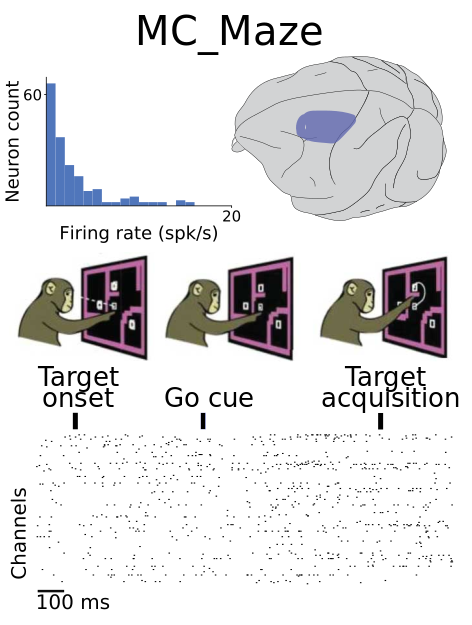

In [7]:
## Load dataset
dataset = NWBDataset("/content/000139/sub-Jenkins/", "*train", split_heldout=False)


NameError: ignored

In [2]:
print(f"The bin_width pre-resampling is {dataset.bin_width} ms")

## Optional resampling
# It may be beneficial to resample the data before you proceed to the analysis sections,
# as they may be fairly memory-intensive. However, we have not tested this notebook at bin sizes
# of over 20 ms, so we cannot guarantee that everything will work as intended at
# those larger bin sizes. If you still have memory issues, you could also use the reduced size
# datasets instead of the full one.
dataset.resample(5)

bin_width = dataset.bin_width
print(f"The bin_width post-resampling is {bin_width} ms")

NameError: ignored

## Task

The maze task is a delayed center-out reaching task, meaning that there was a period between target presentation and the go cue when the monkey could plan and prepare its movement.

The reaches took place in a number of maze configurations, resulting in a variety of straight and curved reaches. In some trials, three targets were presented, though only one was reachable, further complicating the task for the monkey. The delayed reaching paradigm allows for the examination of neural activity during both movement preparation and execution.


## Time Alignment

### Plan and Movement Neural Activity
Two types of neural activity are commonly used for driving prosthetic systems: plan and movement activity.


*   **Plan Activity**: Plan activity is present before arm movements begin and is believed to reflect preparatory processing required for the fast and accurate generation of movement. Plan activity has been shown to reflect reach target, peak velocity, eye position and attention.
*   **Movement Activity**: Movement activity follows plan activity in a delayed reach task. Movement activity often exhibits a moment-to-moment correspondence with the intended trajectory of the hand's movement.

Localization of the neural activity for movement plan and control:
*   **PMd (dorsal premotor cortices) neurons** typically exhibit strong plan activity, as well as some movement activity
*   **M1 (Primary motor cortex) neurons** typically exhibit the opposite pattern


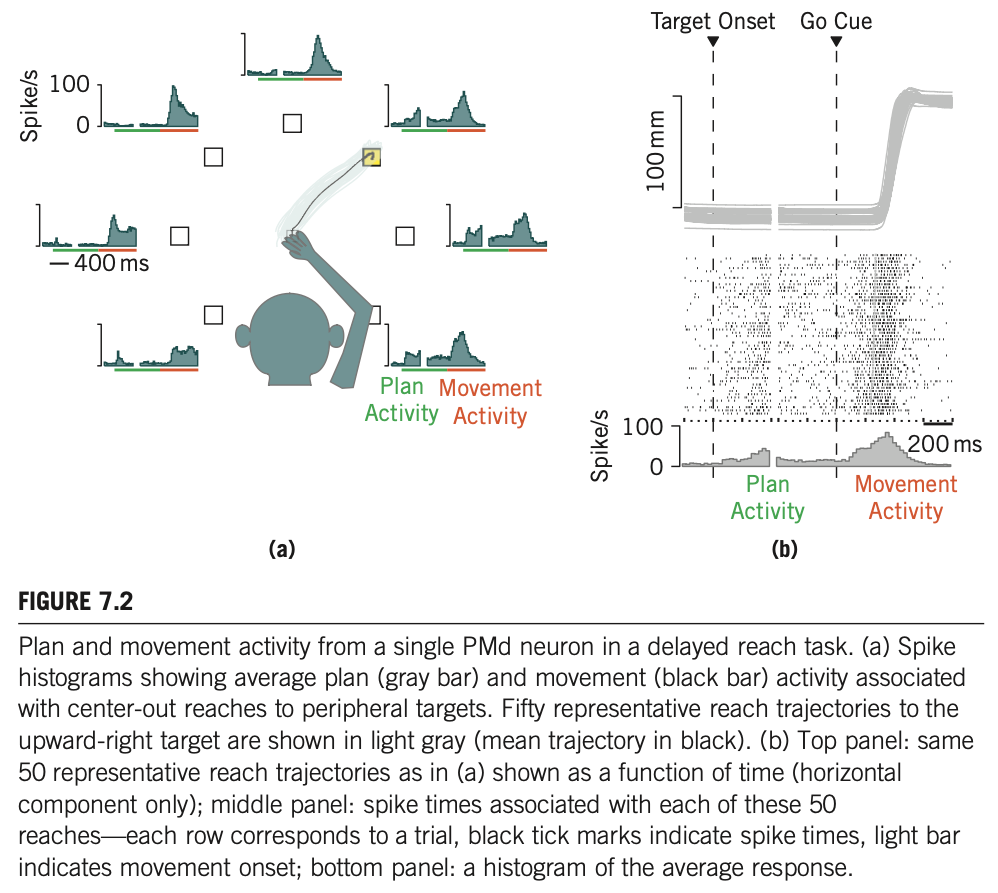


### [500ms Plan Activity, 500ms Movement Activity] Aligned at `move_onset_time`

*   `data_align_field` | This parameter represents the time-mark used for trial alignment. By setting `data_align_field = move_onset_time`, it implies that time point 0 will uniformly correspond to the moment when the movement initiates.

*   `data_align_range` | This parameter defines the time range in milliseconds relative to the time-aligned time point 0. When `data_align_field = move_onset_time`, (-500, 0) corresponds to the preparatory activity, whereas (0, 500) corresponds to the execution/movement activity.


In [4]:
data_align_field='move_onset_time'
data_align_range = (-500, 500)

## Behavior Recording
In addition to the neural data, cursor position and the monkeys' hand and gaze position were recorded during the experiment, and the hand velocity was estimated offline using the recorded hand position.

* `cursor_pos` | x and y position of the cursor controlled by the monkey
* `eye_pos` | x and y position of the monkey's point of gaze on the screen, in mm
* `hand_pos` | x and y position of the monkey's hand, in mm
* `hand_vel` | x and y velocities of the monkey's hand, in mm/s, computed offline using np.gradient

There are 27 different reach conditions in the MC_Maze dataset. Here, we'll plot the average trajectory per condition to see what typical reaches look like.

In [6]:
## Plot trial-averaged reaches

# Find unique conditions
conds = dataset.trial_info.set_index(['trial_type', 'trial_version']).index.unique().tolist()

# Initialize plot
fig = plt.figure(figsize=(6, 6))
ax = fig.add_axes([0.1, 0.1, 0.8, 0.8])

# Loop over conditions and compute average trajectory
for cond in conds:
    # Find trials in condition
    mask = np.all(dataset.trial_info[['trial_type', 'trial_version']] == cond, axis=1)
    # Extract trial data
    trial_data = dataset.make_trial_data(align_field=data_align_field, align_range=data_align_range, ignored_trials=(~mask))
    # Average hand position across trials
    traj = trial_data.groupby('align_time')[[('hand_pos', 'x'), ('hand_pos', 'y')]].mean().to_numpy()
    # Determine reach angle for color
    active_target = dataset.trial_info[mask].target_pos.iloc[0][dataset.trial_info[mask].active_target.iloc[0]]
    reach_angle = np.arctan2(*active_target[::-1])
    # Plot reach
    ax.plot(traj[:, 0], traj[:, 1], linewidth=0.7, color=plt.cm.hsv(reach_angle / (2*np.pi) + 0.5))
    ax.scatter(traj[-1, 0], traj[-1, 1], color=plt.cm.hsv(reach_angle / (2*np.pi) + 0.5))

plt.axis('off')
plt.show()

NameError: ignored

### Reaching Velocity and Trajectory for one example Condition

In [ ]:
fig, axs = plt.subplots(1, 3, figsize=(10, 3))
for i in set(trial_data['trial_id']):
    axs[0].plot(np.arange(data_align_range[0],data_align_range[1],bin_width),trial_data[trial_data['trial_id'] == i].hand_vel.x, 'k')
axs[0].axvline(0,0,1,color='r')
axs[0].set_title('Velocity x')

for i in set(trial_data['trial_id']):
    axs[1].plot(np.arange(data_align_range[0],data_align_range[1],bin_width),trial_data[trial_data['trial_id'] == i].hand_vel.y, 'k')
axs[1].axvline(0,0,1,color='r')
axs[1].set_title('Velocity y')
axs[1].set_xlabel(f'Time after {data_align_field} (ms)')

# TODO: plot the trajectory for each trial with trial id set(trial_data['trial_id'])
for i in set(trial_data['trial_id']):
    # x_pos = ...
    # y_pos = ...
    x_pos = np.cumsum(trial_data[trial_data['trial_id'] == i].hand_vel.x, axis=0) * bin_width / 1000
    y_pos = np.cumsum(trial_data[trial_data['trial_id'] == i].hand_vel.y, axis=0) * bin_width / 1000
    axs[2].plot(x_pos, y_pos, color = 'k')
axs[2].set_xlim(-150,150)
axs[2].set_ylim(-150,150)
axs[2].set_title('Trajectory')

Hint: Recall velocity is the rate of change of position s.t. $v = \frac{\Delta p}{\Delta t}$.

💡 **Thinking Bubble** | What will happen when aligning trials based on the target onset time (i.e. data_align_field='target_on_time')?

## Neural Recording

For these datasets, neural activity was recorded from two Utah arrays: one implanted in the dorsal premotor cortex, which is thought to play a role in movement planning, and one in the primary motor cortex.

This recorded data was spike sorted offline into the provided unit spike times.


* `spikes` | spike times binned at 1 ms



### Single-neuron responses

Various aspects of movement (e.g. position, velocity, acceleration, and force) are encoded in the activity of neurons throughout the motor system. Even though our understanding of movement encoding in the motor system is incomplete (mechanism of cortex control for movement), there is usually a relationship between aspects of movement and neural activity. This reliable relationship allows us to estimate the desired movements from neural activity.

Consider the activity of an individual neuron across repeated movements (referred to as 'trials') to the same target. The activity of the neuron can be averaged across many trials to create a spike histogram for each target, often referred to as peristimulus time histogram (PSTH). By comparing the spike histograms for different target, one can characterize how the neuron's activity varies with the movement produced.

Given leftward and rightward arm reaching as an example, the firing rate of the neuron (approximated with spike histogram) shows statistical regularity across the two reach condition and across time.

*   Distinct spike patterns for leftward and rightward arm reaching in both preparation and execution time period. On average, a greater level of preparation activity for leftward movements and a greater level of execution activity for rightward movements.
*   Consistent moment-by-moment variability in spike patterns across trials of similiar arm reaching indicates correlation between neural activity and arm trajectory across time.





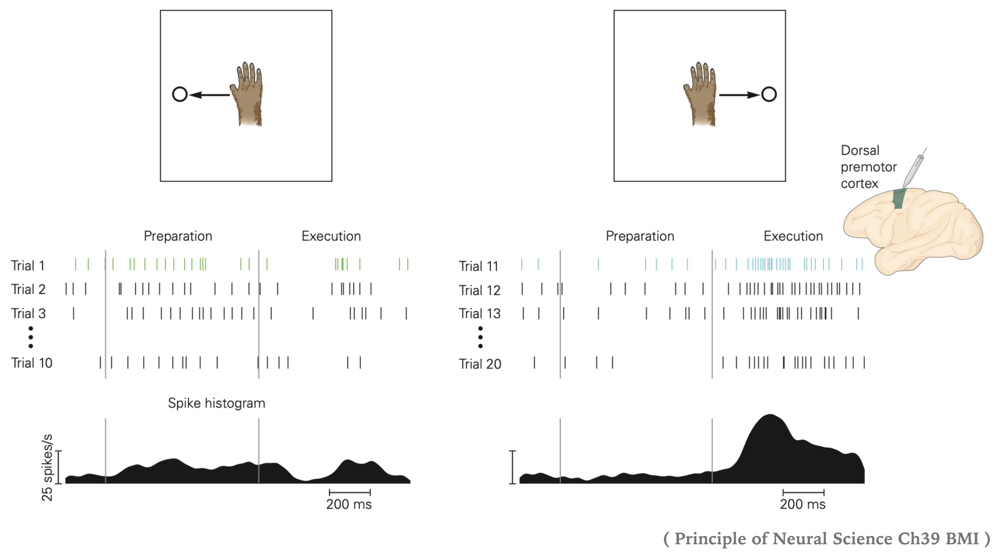

### Peristimulus Time Histogram (PSTH)
As shown in the Behavior Recording Section, there are a large number of reaching conditions in the MC_Maze dataset which differ in the position of targets and barriers. To understand the neural activity that drives the movement of each of the reaching conditions, we plot the PSTH computed by grouping the trials with reaching conditions.

Note: The color corrsponds to discretized reaching angle.


---

If you recieved "ValueError: cannot handle a non-unique multi-index!" it suggest that you are attempt to resample `dataset.resample(5)` or smooth the spikes with `dataset.smooth_spk(50, name='rate')` multiple times. Reload the dataset and run through the code again.

---


In [ ]:

## Plot PSTHs

# Seed generator for consistent plots
np.random.seed(2468)
n_conds = 27 # number of conditions to plot

# Smooth spikes with 50 ms std Gaussian
dataset.smooth_spk(50, name='rate')

# Plot random neuron
neur_num = np.random.choice(dataset.data.spikes.columns)

# Find unique conditions
conds = dataset.trial_info.set_index(['trial_type', 'trial_version']).index.unique().tolist()

fig, axs = plt.subplots(1, 2, figsize=(10, 3))
# Plot random subset of conditions
for i in np.random.choice(len(conds), size=n_conds, replace=False):
    cond = conds[i]
    # Find trials in condition
    mask = np.all(dataset.trial_info[['trial_type', 'trial_version']] == cond, axis=1)
    # Extract trial data
    trial_data = dataset.make_trial_data(align_field=data_align_field, align_range=data_align_range, ignored_trials=(~mask))
    # Average neural spike trian across trials
    psth = trial_data.groupby('align_time')[[('spikes_rate', neur_num)]].mean().to_numpy() / dataset.bin_width * 1000
    # Average hand position across trials
    traj = trial_data.groupby('align_time')[[('hand_pos', 'x'), ('hand_pos', 'y')]].mean().to_numpy()
    # Color PSTHs by reach angle
    active_target = dataset.trial_info[mask].target_pos.iloc[0][dataset.trial_info[mask].active_target.iloc[0]]
    reach_angle = np.arctan2(*active_target[::-1])
    # Plot PSTH
    axs[0].plot(np.arange(data_align_range[0],data_align_range[1], dataset.bin_width), psth, label=cond, color=plt.cm.hsv(reach_angle / (2*np.pi) + 0.5))
    # Plot reach
    axs[1].plot(traj[:, 0], traj[:, 1], linewidth=0.7, color=plt.cm.hsv(reach_angle / (2*np.pi) + 0.5))
    axs[1].scatter(traj[-1, 0], traj[-1, 1], color=plt.cm.hsv(reach_angle / (2*np.pi) + 0.5))

# Add labels
axs[0].set_ylim(bottom=0)
axs[0].set_xlabel(f'Time after {data_align_field} (ms)')
axs[0].set_ylabel('Firing rate (spk/s)')
axs[0].set_title(f'Neuron {neur_num} PSTH')
# plt.legend(title='condition', loc='upper right')

axs[1].axis('off')
axs[1].set_title(f'Reaching Trajectories')

plt.show()



*   **Observation**: Neural PSTH for similiar reaching target (color-coded by discretized reaching angle) tend to cluster together.
*   **Observation**: Neural PSTH varies across time and show complex characteristics as a function of time.
*   **Observation**: The timecourse of neural activity (preparation and execution) for each reaching condition is different.



# Formulate the Neural Decoding Problem

The primary goal of the neural decoding algorithm is to translate the electrical neural activity from the brain into control signals for guiding paralyzed upper limbs, prosthetic arms, and computer cursors to achieve user's movement intent. Neural decoding algorithms can be devised to decode the desired movement trajectory (continuous decoder) or movement target (discrete decoder) based on the pattern of neural activity.

To direct the prosthetic arm through space, the neural decoder must produce movement trajectories as accurately as possible to enact precisely the desired movement. The **continuous decoder** translates, on a moment-by-moment basis, neural activity into a continuous-valued movement trajectory.

In contrast, for neural decoder to direct the cursor for key selection on the keyboard, the percise trajectory moving through the keyboard is less important compare to the speed in decoding the target key. The **discrete decoder**, thus, act as a classifier to classify the reaching target while the user is preparing and completing the reach.

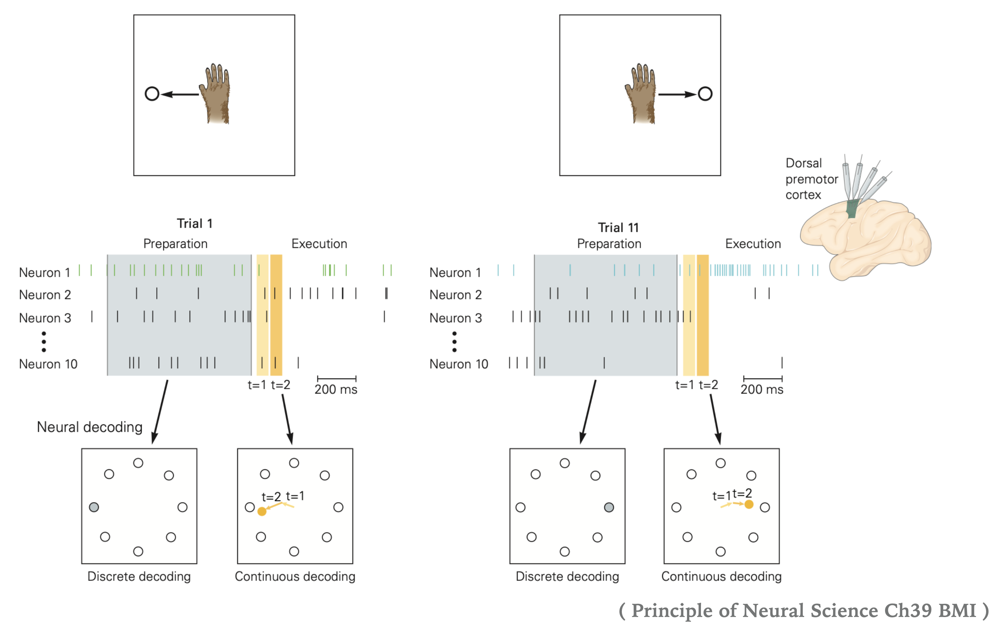

In the cartoon example above, there are 8 reaching targets in the workspace

*   **Discrete decoding** extracts the target location. The example above demonstrates the decoding of a reaching target with preparatory activity. Additionally, integrating the earlier part of the execution activity may further enhance the accuracy of the classifier for reaching the target.
*   **Continuous decoding** extracts the moment-by-moment details of the movement. In practice, only the execution activity is used for continuous decoding. There is a reliable moment-to-moment correspondence between neural activity and movement parameters with a fixed response delay.



## Format the Data

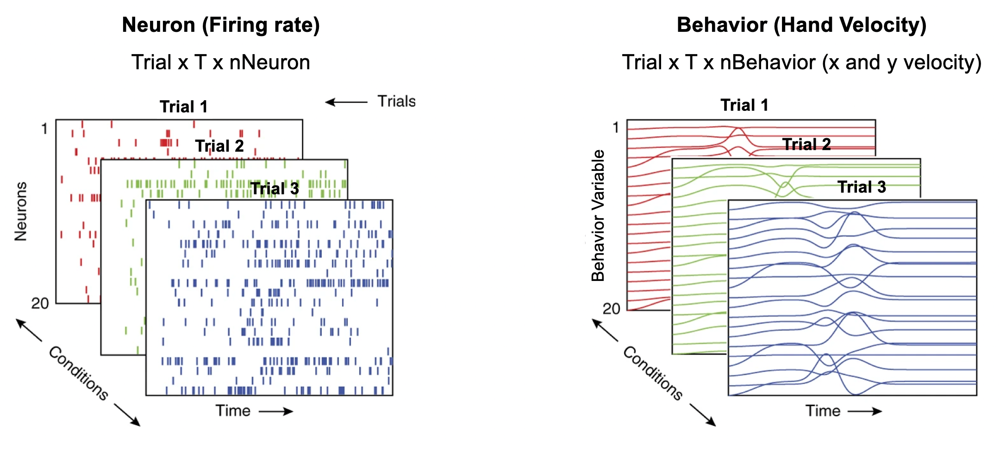

In [ ]:
# alignment parameter for this dataset
data_align_field='move_onset_time'
data_align_range = (-500, 500)
# Decoding behavior with neural response preceding the behavior
response_delay = -70

# Select hand velocity and hand position and behavior data
behavior_data_fields = ['hand_vel', 'hand_pos']
# Select smoothed spike train as neural feature
neuron_data_fields = ['spikes_rate']

# Size of the time bin in (ms) for each time sample
bin_width = dataset.bin_width
# Number of discrete state
n_state = 6

In [ ]:
## Load dataset
dataset = NWBDataset("/content/000139/sub-Jenkins/", "*train", split_heldout=False)

# Resample the data to get binned spike count in 5ms window
dataset.resample(5)

# Smooth spikes with 50 ms std Gaussian
dataset.smooth_spk(50, name='rate')

In [ ]:
## Format data into dictionary of data tensor and data information

data_dict = {'hand_vel': [],
             'hand_pos': [],
             'cond_label': [],
             'cond': [],
             'reach_angle':[],
             'spikes_rate':[],
             'traj':[],
             'psth':[],
             'trial_colors': []}

# Find unique conditions
conds = dataset.trial_info.set_index(['trial_type', 'trial_version']).index.unique().tolist()
trial_id = []

# Loop over conditions and compute average trajectory
for cond_i, cond in enumerate(conds):
    # Find trials in condition
    mask = np.all(dataset.trial_info[['trial_type', 'trial_version']] == cond, axis=1)
    cond_trial_id = np.where(mask)[0]
    trial_id.extend(cond_trial_id)
    nTrial = len(cond_trial_id)
    # Format the condition array
    data_dict['cond_label'].extend([cond] * nTrial)
    data_dict['cond'].extend([cond_i] * nTrial)

    # Extract trial data
    behavior_trial_data = dataset.make_trial_data(align_field=data_align_field, align_range=data_align_range, ignored_trials=(~mask))
    # # Group the trials base on the trial_id
    behavior_array_dict = make_stacked_array(behavior_trial_data, behavior_data_fields, data_dict)
    # Average hand position across trials
    # traj = trial_data.groupby('align_time')[[('hand_pos', 'x'), ('hand_pos', 'y')]].mean().to_numpy()
    data_dict['traj'].append(np.mean(behavior_array_dict['hand_pos'],0)[np.newaxis,:,:])

    # Extract trial data
    neuron_trial_data = dataset.make_trial_data(align_field=data_align_field, align_range=tuple(map(lambda x: x + response_delay,data_align_range)), ignored_trials=(~mask))
    # # Group the trials base on the trial_id
    neuron_array_dict = make_stacked_array(neuron_trial_data, neuron_data_fields, data_dict)
    # Average hand position across trials
    # psth = trial_data.groupby('align_time')[[('spikes_rate', neur_num)]].mean().to_numpy() / dataset.bin_width * 1000
    data_dict['psth'].append(np.mean(neuron_array_dict['spikes_rate']/ dataset.bin_width * 1000,0)[np.newaxis,:,:])

    # Determine reach angle for color
    active_target = dataset.trial_info[mask].target_pos.iloc[0][dataset.trial_info[mask].active_target.iloc[0]]
    reach_angle = np.arctan2(*active_target[::-1])
    data_dict['reach_angle'].extend([reach_angle] * nTrial)
    data_dict['trial_colors'].extend([plt.cm.hsv(reach_angle / (2*np.pi) + 0.5)] * nTrial)

trial_order = np.argsort(trial_id)

# Obtain state by discretize the reach angle
data_dict['state'] = np.digitize(data_dict['reach_angle'], bins= np.linspace(-np.pi, np.pi, num=n_state+1)) - 1
transfer_dict = { s:i for i, s in enumerate(np.unique(data_dict['state']))}
data_dict['state'] = np.array([ transfer_dict[s] for s in list(np.squeeze(data_dict['state']))])
data_dict['nState'] = len(np.unique(data_dict['state']))

print("===============================")
print("Key data fields in data_dict")
print("===============================")

for key in data_dict.keys():
    if type(data_dict[key]) in [list, np.array, np.ndarray]:
        data_dict[key] = np.vstack(data_dict[key])
        print(f"{key}: {np.shape(data_dict[key])}")
    else:
        print(f"{key}: {data_dict[key]}")
    if key not in ['traj', 'psth', 'nState']:
      data_dict[key] = data_dict[key][trial_order]
data_dict['trial_id'] = np.array(trial_id)[trial_order]

## Continuous Decoder (Regression)

To predict the intended movement trajectories percisely, the continuous decoder translates, on a moment-by-moment basis, neural activity into a continuous-valued movement trajectory. In this case, the decoder solves a regression problem.

In [24]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split

### Machine Learning Regression

#### Ridge Regression

Linear regression with L2 norm penalty for size of the weights to encourage a regression model that generate better at testing time


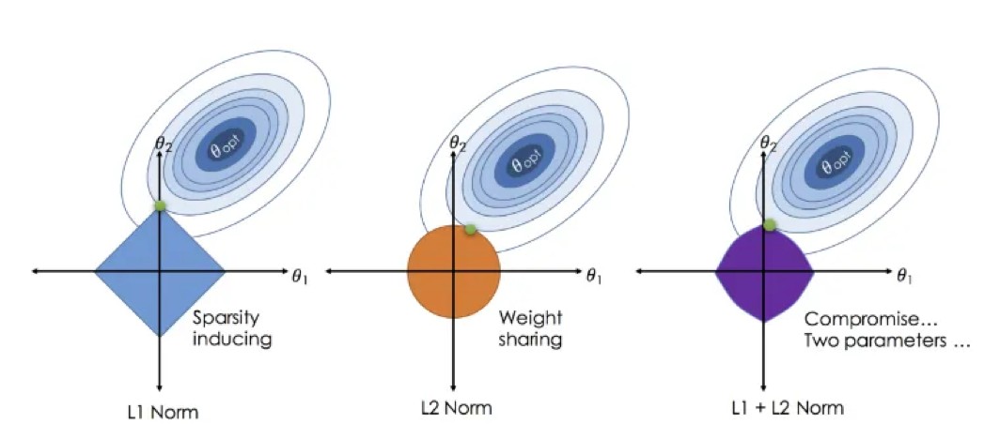

##### Model Fitting

In [25]:
## Kinematic decoding

nTrial, T, _ = np.shape(data_dict['spikes_rate'])

# Train test split
cond = data_dict['cond']
reg_split = train_test_seq_split(data_dict, ['spikes_rate','hand_vel'], stratify=cond)

# Fit and evaluate decoder
gscv = GridSearchCV(Ridge(), {'alpha': np.logspace(-4, 0, 5)})

gscv.fit(reg_split['train']['spikes_rate_flatten'], reg_split['train']['hand_vel_flatten'])


=== train Data ===
Decoding R2: 0.9959651139415143
=== test Data ===
Decoding R2: 0.04131468868461461


##### Evaluation: Percentage of variance explained (R-squared)

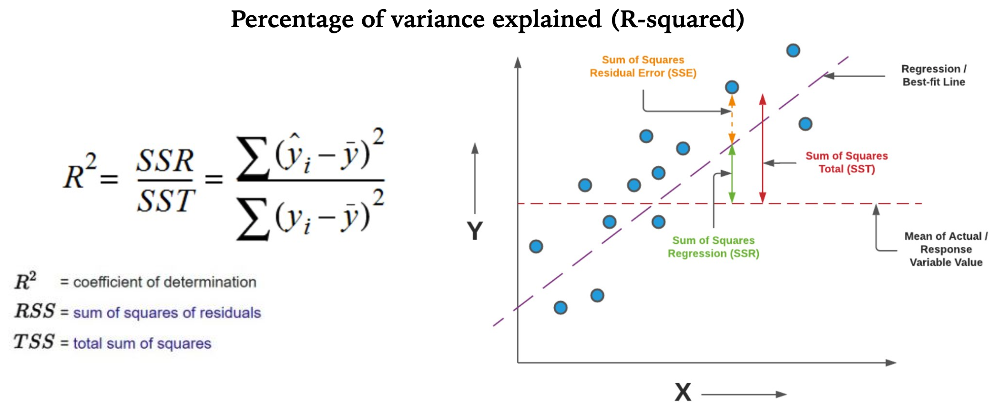

In [36]:
# Continuous decoder prediction
for split_i in ['train', 'test']:
    reg_split[split_i]['pred_hand_vel_flatten'] = gscv.predict(reg_split[split_i]['spikes_rate_flatten'])
    reg_split[split_i]['pred_hand_vel'] = np.reshape(reg_split[split_i]['pred_hand_vel_flatten'],[reg_split[split_i]['nTrial'], T, -1])
    # Compute the decoding R^2
    print(f"=== {split_i} Data ===")
    reg_split[split_i]['r2_hand_vel'] = r2_score(reg_split[split_i]['hand_vel_flatten'],
                                             reg_split[split_i]['pred_hand_vel_flatten'])
    print(f"Decoding R2: {reg_split[split_i]['r2_hand_vel']}")

=== train Data ===
Decoding R2: 0.9959651139415143
=== test Data ===
Decoding R2: 0.04131468868461461


##### Evaluation: Visualizing decoded hand trajectory (per condition, repeated trials)

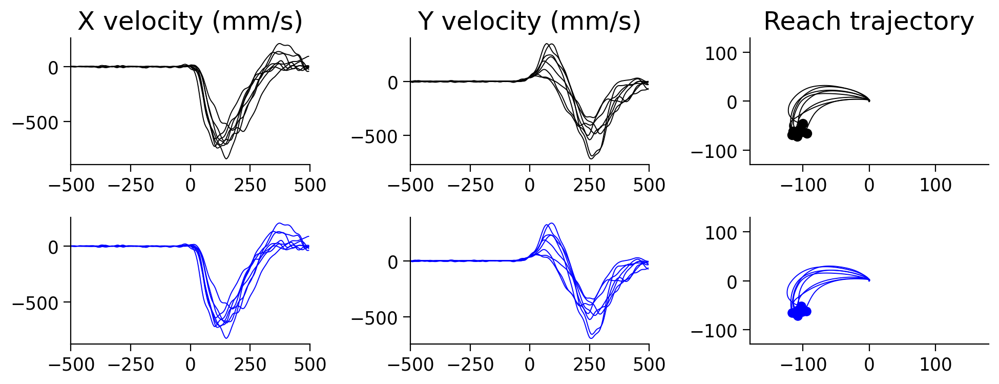

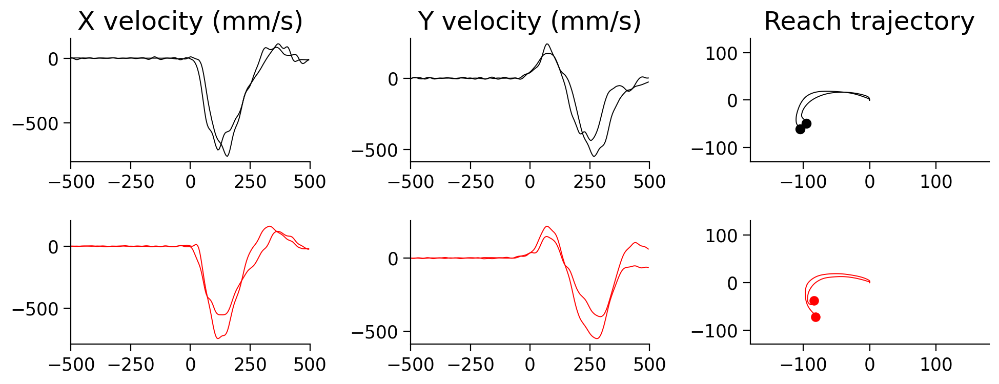

In [26]:
## Plot predicted vs true kinematics

# Choose 23rd condition to plot
cond = conds[0]
# Extract the trial index that corspond to the selected condition
mask = np.all(dataset.trial_info[['trial_type', 'trial_version']] == cond, axis=1).to_numpy()

# Find trials in condition and extract data
true_data = data_dict['hand_vel']

# Training data
train_mask = mask[reg_split['train']['trial']]
# Apply condition mask on training data
true_data_train = true_data[reg_split['train']['trial'][train_mask],:,:]
pred_data_train = reg_split['train']['pred_hand_vel'] [train_mask]
# Plot predicted vs true kinematics
plot_continuous_decoder(data_align_range, bin_width, true_data_train, pred_data_train)

# Testing data
test_mask = mask[reg_split['test']['trial']]
# Apply condition mask on training data
true_data_test = true_data[reg_split['test']['trial'][test_mask],:,:]
pred_data_test = reg_split['test']['pred_hand_vel'] [test_mask]
# Plot predicted vs true kinematics
plot_continuous_decoder(data_align_range, bin_width, true_data_test, pred_data_test, color=['black','red'])

### Neural Network Regression

#### Recurrent Neural Network

The neural data and hand reaching data are time-series data, or sequence data. Such types of data usually have dependencies on the data from previous time steps. It's natural that we want to have a model that can also capture temporal dependencies.

Taking inspiration from the brain's recurrent connections, scientists proposed the recurrent neural network (RNN) to model sequential problems like machine translation, text generation, speech synthesis etc. Though different in task objective, input feature and data structure, it shares many characteristic to the constinuous decoding problem you are working on at hand.

The cartoon below illustrates the core component, the recurrent layer for the RNN. In addition to the recurrent layer, RNN architecture often consists of additional MLF layers to map the neural activity $h_t$ to the desired dimensions of the output $y_t$.

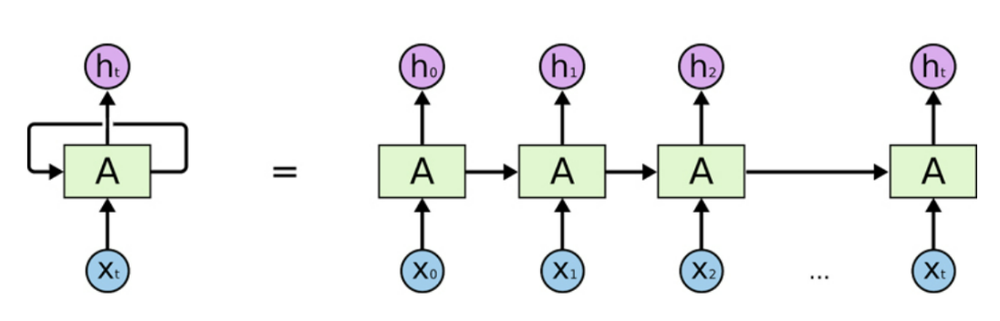

When training an RNN as a continuous decoder, it is crucial to make the right choice regarding the neural network architecture. Here are some key considerations:

*   **One to many**: These models excel in strong forward predictive power and are often applied in tasks involving generation, for example, text generation.

*   **Many to one**: Models in this category are trained to summarize information from an entire sequence. They typically exhibit weak alignment with respect to time, and the integrated information is commonly used for tasks such as sequence-based classification.

*   **Many to many (disconnected time-points)**: These models facilitate sequence-to-sequence mapping with variable lengths of input and output, making them suitable for tasks like machine translation, where the temporal structures of input and output data differ significantly.

*   **Many to many (tight time-point correspondence)**: In this category, sequence-to-sequence mapping maintains tight alignment between time-points, making it suitable for mapping sequences with shared or similar dynamics. This is particularly useful in tasks like speech recognition or text synthesis.

By carefully selecting the appropriate architecture based on the specific requirements of your task, you can optimize the performance of your continuous decoder RNN.


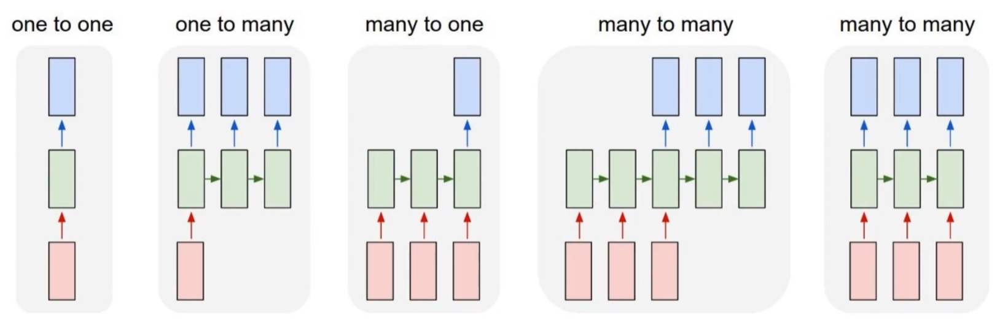

#### RNN(GRU): many-to-many

In this prototype decoding model, we considered many-to-many architecture given there is known moment-to-moment relationship between neural response and behavior. In addition we used GRU unit to enable more flexibility in modeling the temporal dependency across both short and long time span.  

💡 **Thinking Bubble** | If the initial activity aren't so close to 0 for all reaching, one-to-many architecture could also be a good choice to model the dyanmics of reaching behavior. Could we leverage the preparatory neural activity to enable such forward prediction model before the movement onset?

In [27]:
# Import NN related packages
import math
import torch
import torch.nn as nn
from torch.utils.data import TensorDataset, DataLoader
from tqdm import trange
from torch.optim.lr_scheduler import StepLR, ReduceLROnPlateau, CosineAnnealingLR
import matplotlib.pyplot as plt

In [28]:
# Define RNNRegressor Model as the Continuous Decoder
class RNNRegressor(nn.Module):
    def __init__(self, input_size, hidden_size, layer_size, output_size):
        """
        Initialize an RNN-based regression model.

        Args:
            input_size (int): The size of the input data.
            hidden_size (int): The size of the hidden state.
            layer_size (int): The number of recurrent layers.
            output_size (int): The size of the model's output.

        """
        super(RNNRegressor, self).__init__()
        self.input_size, self.hidden_size, self.layer_size, self.output_size = input_size, hidden_size, layer_size, output_size
        # Create RNN
        self.rnn = nn.GRU(input_size, hidden_size, layer_size, batch_first=True, bias=True)
        # Create fully connected layer
        self.fc = nn.Linear(hidden_size, output_size)
        # Initialize the parameters
        self.reset_parameters()

    def forward(self, x):
        """
        Forward pass through the RNN-based regression model.

        Args:
            x (torch.Tensor): Input data.

        Returns:
            torch.Tensor: Model's output.

        """
        # Generate initial hidden states (all zeros)
        hidden_state = torch.zeros(self.layer_size, x.shape[0], self.hidden_size)
        hidden_state = hidden_state.requires_grad_()
        # Get output from RNN
        output, last_hidden_state = self.rnn(x, hidden_state)
        # Get output from fully connected layer and obtain the regression prediction
        output = torch.squeeze(self.fc(output))
        return output

    def reset_parameters(self):
        """
        Initialize the model's parameters with random values.

        """
        # Randomly sampled initialization conditions
        stdv = 1.0 / math.sqrt(self.hidden_size)
        for name, weight in self.named_parameters():
            nn.init.uniform_(weight, -stdv, stdv)


Note: For RNN Training function, the key is to perform the following 5 steps in each batch/epoch of training.

        # Step ①: Perform the forward pass of the model
        y_hat = model(input)
        # Step ②: get the loss for current batch
        loss = loss_fn(y_hat, y)
        # Step ③: Clear the gradient buffers of the optimized parameters.
        # Otherwise, gradients from the previous batch would be accumulated.
        optimizer.zero_grad()
        # Step ④: compute the gradient
        loss.backward()
        # Step ⑤: popogate the weight update
        optimizer.step()

In [ ]:
def train_regressor(model, train_data, test_data, optimizer, loss_fn, num_epochs, scheduler=None, test=True, log_every=10):
    """
    Trains a regression model.

    Args:
        model (torch.nn.Module): The regression model to be trained.
        train_data (torch.utils.data.Dataset): The training dataset.
        test_data (torch.utils.data.Dataset): The testing dataset.
        optimizer (torch.optim.Optimizer): The optimizer used for training.
        loss_fn (torch.nn.Module): The loss function used for training.
        num_epochs (int): The number of training epochs.
        scheduler (torch.optim.lr_scheduler._LRScheduler or None, optional):
            Learning rate scheduler (default: None).
        test (bool, optional): Whether to perform testing during training (default: True).
        log_every (int, optional): Frequency for logging training progress (default: 10).

    Returns:
        losses (list): List of training losses for each epoch.
        test_loss_list (list): List of testing losses for each epoch (empty if test=False).
        best_dict (dict): Model's state dictionary with the best testing loss.
    """
    model.train()
    losses = []
    test_loss_list = []
    best_dict = model.state_dict()
    # pbar will plot the progress bar during training
    with trange(num_epochs, unit="batches") as pbar:
        pbar.set_description(f"Training Progress")
        # transfer the data into dataloader
        train_loader = torch.utils.data.DataLoader(dataset=train_data, batch_size=batch_size, shuffle=True, drop_last=True)
        test_loader = torch.utils.data.DataLoader(dataset=test_data, batch_size=batch_size, shuffle=True, drop_last=True)
        for epoch in pbar:
            # train model
            model.train()
            train_loss = 0
            for j, (input, y) in enumerate(train_loader):  # load train data

                # Step ①: Perform the forward pass of the model
                y_hat = model(input)
                # Step ②: get the loss for the current batch
                loss = loss_fn(y_hat, y)
                # Step ③: Clear the gradient buffers of the optimized parameters.
                # Otherwise, gradients from the previous batch would be accumulated.
                optimizer.zero_grad()
                # Step ④: compute the gradient
                loss.backward()
                # Step ⑤: propagate the weight update
                optimizer.step()

                # use learning rate scheduler after computing the loss to change the learning rate, if defined
                if scheduler is not None and isinstance(scheduler, ReduceLROnPlateau):
                    scheduler.step(loss)
                elif scheduler is not None:
                    scheduler.step()
                # track the training loss
                train_loss += loss.item()  # .item() to get the value in the tensor variable

            # evaluate the model after training log_every epochs
            if (epoch + 1) % log_every == 0:
                losses.append(train_loss / (j + 1))
                if test:
                    with torch.no_grad():
                        model.eval()
                        test_loss = 0
                        for k, (input, y) in enumerate(test_loader):  # load test data
                            y_hat = model(input)
                            test_loss += loss_fn(y_hat, y).item()

                    # add some information in the progress bar
                    pbar.set_postfix(test_loss=test_loss / (k + 1))
                    test_loss_list.append(test_loss / (k + 1))
                    if test_loss / (k + 1) <= min(test_loss_list):
                        best_dict = model.state_dict()
                else:
                    pbar.set_postfix(loss=train_loss / (j + 1))
    return losses, test_loss_list, best_dict


In [ ]:
# Train test split
cond = data_dict['cond']
RNNreg_split = train_test_seq_split(data_dict, ['spikes_rate','hand_vel','hand_pos'], stratify=cond)
train_data = RNNreg_split['train']['spikes_rate'].astype(np.float32) # change data type to float (default in NN)
train_targets = np.concatenate([RNNreg_split['train']['hand_vel'].astype(np.float32), RNNreg_split['train']['hand_pos'].astype(np.float32)], axis=2)
test_data = RNNreg_split['test']['spikes_rate'].astype(np.float32)
test_targets = np.concatenate([RNNreg_split['test']['hand_vel'].astype(np.float32), RNNreg_split['test']['hand_pos'].astype(np.float32)], axis=2)

# transfer data into tensor
train_data = TensorDataset(torch.from_numpy(train_data), torch.from_numpy(train_targets))
test_data = TensorDataset(torch.from_numpy(test_data), torch.from_numpy(test_targets))


##### Training RNNRegressor

In [ ]:
# define some hyperparameters to play with
batch_size = 20 # depends on the memory you have
learning_rate = 0.001 # too large learning rate in RNN will lead to gradient explosion
num_epochs = 5 # need 5000 epochs to converge, set 50 epochs here for practice purpose
hidden_size = 128 # depends on the memory you have, but too large size may lead to gradient explosion
layer_size = 1 # we usually only use one layer size for RNN

# other parameters
input_size = data_dict['spikes_rate'].shape[-1] # input size be the number of recorded neurons
output_size = 4 # 2 for hand velocity and 2 for hand positioin
log_every = 1 # intervals to test the training accuracy

Training Progress: 100%|██████████| 5/5 [00:09<00:00,  1.86s/batches, test_loss=3.05e+4]


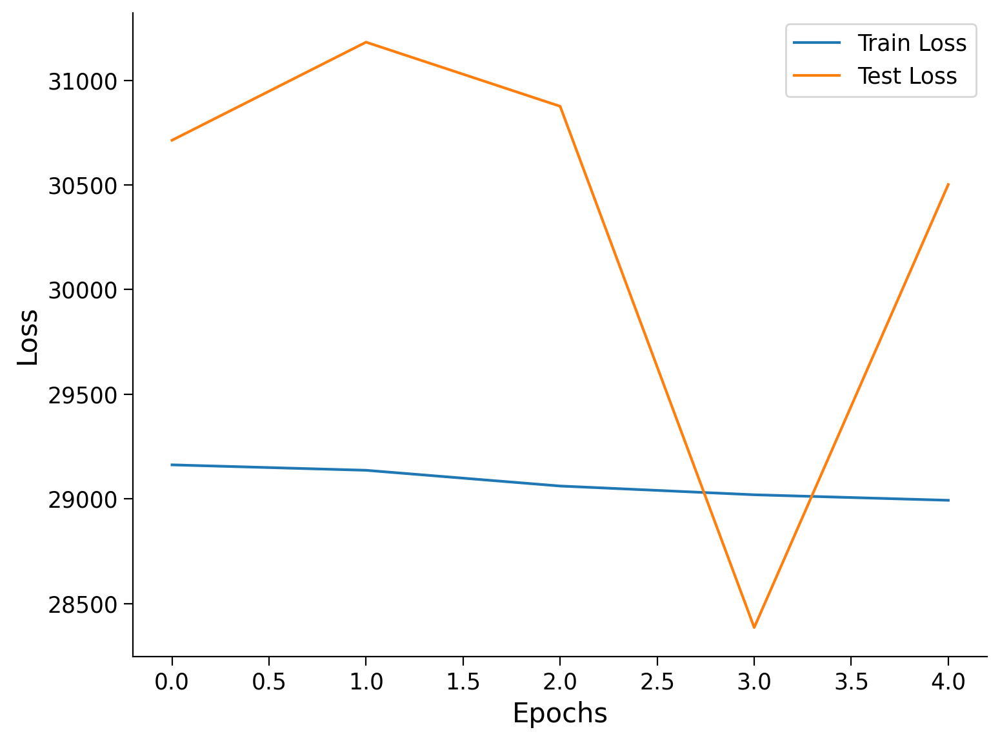

In [ ]:
# Training the RNN to do regression

# Define model, optimizer and loss function
rnn_regressor = RNNRegressor(input_size, hidden_size, layer_size, output_size)
optimizer = torch.optim.Adam(rnn_regressor.parameters(), lr=learning_rate, weight_decay=1e-5) # weight_decay: L2 regularization on weights
loss_fn = nn.MSELoss()

# define a scheduler to change the learning rate
# scheduler = StepLR(optimizer, step_size=1000, gamma=0.1)
# scheduler = CosineAnnealingLR(optimizer, 500, eta_min=0, last_epoch=-1)
# scheduler = ReduceLROnPlateau(optimizer, mode='min', patience=50)
scheduler = None

# Training with train_regressor()
losses, test_loss_list, best_dict = train_regressor(rnn_regressor, train_data, test_data, optimizer, loss_fn, num_epochs, log_every=log_every, scheduler=scheduler)

# plot the training progress
plt.plot(np.arange(0, num_epochs, log_every), losses, label='Train Loss')
plt.plot(np.arange(0, num_epochs, log_every), test_loss_list, label='Test Loss')
# plt.xticks([i for i in range(0, 251, 50)], [str(i) for i in range(0, 5001, 1000)]) # defined for 5000 thousand epochs
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

In [ ]:
# (optional) save the result to google drive
from google.colab import drive
drive.mount('/content/drive')
torch.save(best_dict, '/content/drive/My Drive/EFRI/RNNRegressor/model_best.pth')

drive_filepath = '/content/drive/My Drive/EFRI/RNNRegressor/train_loss.txt'
with open(drive_filepath, 'w') as file:
  for loss in losses:
    file.write(str(loss) + '\n')

drive_filepath = '/content/drive/My Drive/EFRI/RNNRegressor/test_loss.txt'
with open(drive_filepath, 'w') as file:
  for loss in test_loss_list:
    file.write(str(loss) + '\n')

MessageError: ignored

##### Pre-trained RNNRegressor

The pre-trained model with 5000 epochs (approximately 2hrs) is saved at 'https://github.com/chesteklab/EFRI-workshop-2023/raw/main/Pretrained_models/RNN_regressor/model_cond_best.pth'



In [ ]:
# Recorded parameter for saved model ('https://github.com/chesteklab/EFRI-workshop-2023/raw/main/Pretrained_models/RNN_regressor/model_cond_best.pth')
hidden_size = 128 # depends on the memory you have, but too large size may lead to gradient explosion
layer_size = 1 # we usually only use one layer size for RNN
input_size = data_dict['spikes_rate'].shape[-1] # input size be the number of recorded neurons
output_size = 4 # 2 for hand velocity and 2 for hand positioin

In [ ]:
# The training takes ~2hrs
# We trained 5000 epochs
# we provide you with a pretrained model
import requests
import os
from io import BytesIO
os.makedirs('pretrained_models', exist_ok=True)
# down load the model state dict
github_url = 'https://github.com/chesteklab/EFRI-workshop-2023/raw/main/Pretrained_models/RNN_regressor/model_cond_best.pth'
response = requests.get(github_url)
if response.status_code == 200:
  buffer = BytesIO(response.content)
  state_dict = torch.load(buffer, map_location='cpu')
  print('Load state dict successfully.')
else:
  print('Failed to download the file.')

# define the model and load the state dict
rnn_regressor_p = RNNRegressor(input_size, hidden_size, layer_size, output_size)
rnn_regressor_p.load_state_dict(state_dict, strict=True)

Load state dict successfully.


<All keys matched successfully>

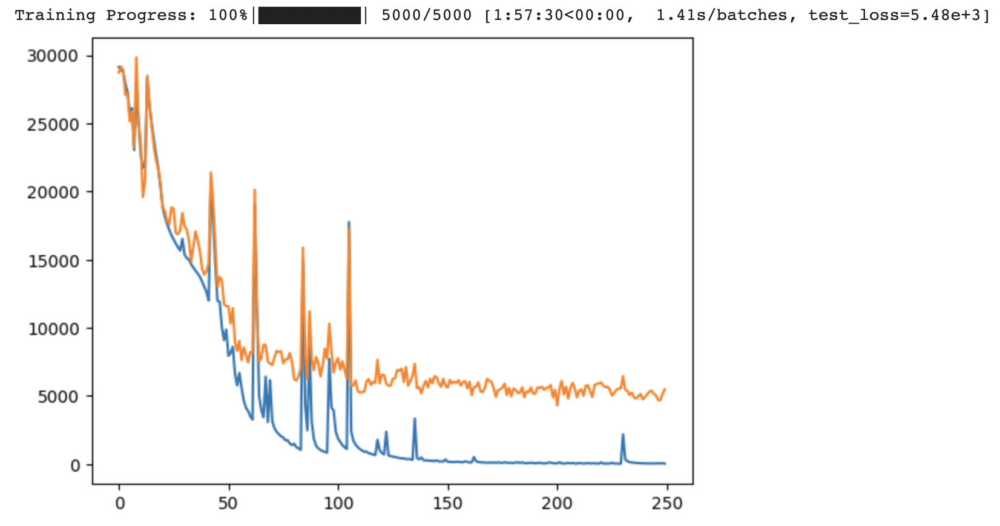

##### Evaluate the Model performance

IndexError: ignored

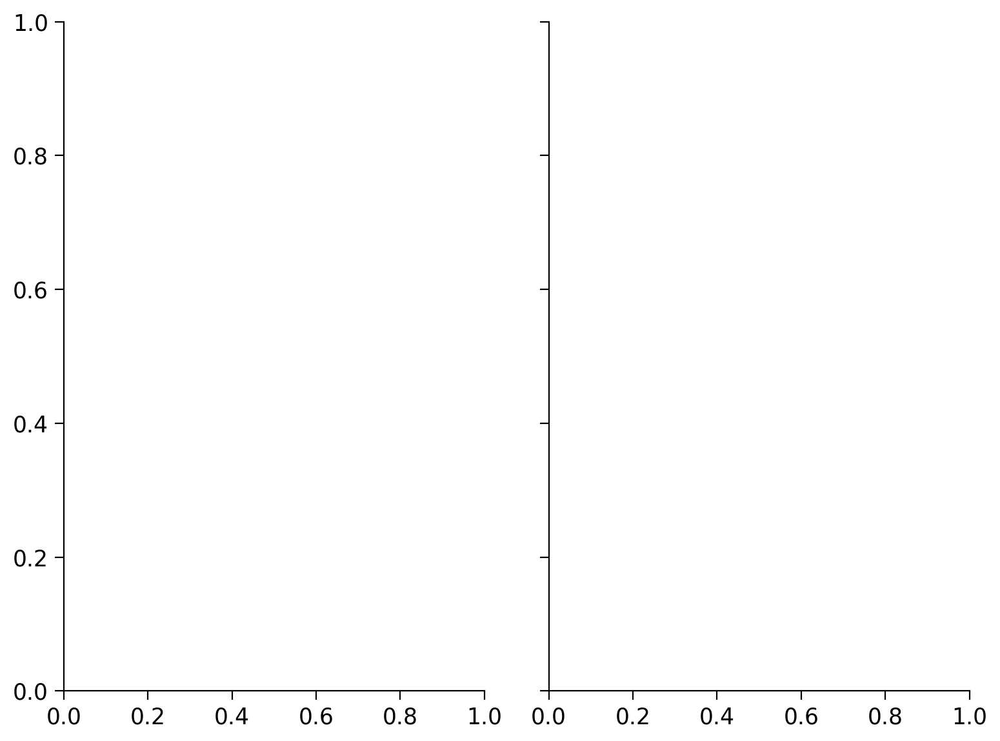

In [ ]:
# take a look at the prediction on training dataset

# load one batch of data from the data loader
dl = DataLoader(train_data, batch_size=batch_size, shuffle=True)
inp, y = next(iter(dl))

# make a prediction based on the model
predicted = rnn_regressor_p(inp)

# plot
fig, axs = plt.subplots(1,2,sharey=True)
for i in range(5):
  axs[0].plot(y[i,:,0]) # look at the x velocity of hand
  axs[0].set_title('Ground truch')
  axs[1].plot(predicted[i,:,0].detach().numpy()) # use .detach().numpy() to transfer tensor data into numpy and plot
  axs[1].set_title('Prediction')

In [ ]:
def rnn_regression_prediction(train_loader, model):
    """
    Get predictions from an RNN regression model.

    Args:
        train_loader (torch.utils.data.DataLoader): DataLoader for the training data.
        model (torch.nn.Module): The trained RNN regression model.

    Returns:
        true_data (numpy.ndarray): True data sequence.
        pred_data (numpy.ndarray): Predicted data sequence.

    """
    true_data = []
    pred_data = []
    with torch.no_grad():
        model.eval()
        for input, y in train_loader:  # load train data
            y_hat = rnn_regressor_p(input)  # get the prediction from each batch
            true_data.append(y)
            pred_data.append(y_hat.detach().numpy())

    true_data = np.concatenate(true_data, axis=0)
    pred_data = np.concatenate(pred_data, axis=0)

    return true_data, pred_data

In [ ]:
# Model prediction for training and testing data

true_data_train, pred_data_train = rnn_regression_prediction(DataLoader(train_data, batch_size=batch_size, shuffle=False), rnn_regressor_p)
true_data_test, pred_data_test = rnn_regression_prediction(DataLoader(test_data, batch_size=batch_size, shuffle=False), rnn_regressor_p)
nTrial_train = np.shape(true_data_train)[0]
nTrial_test = np.shape(true_data_test)[0]

# Print out the decoding R^2
print(f"=== Training Data ===")
train_r2_score = r2_score(np.reshape(true_data_train[:,:,:2],[nTrial_train ,-1]), np.reshape(pred_data_train[:,:,:2],[nTrial_train ,-1]))
print(f"Decoding R2: {train_r2_score}")

print(f"=== Testing Data ===")
test_r2_score = r2_score(np.reshape(true_data_test[:,:,:2],[nTrial_test ,-1]), np.reshape(pred_data_test[:,:,:2],[nTrial_test ,-1]))
print(f"Decoding R2: {test_r2_score}")

=== Training Data ===
Decoding R2: -0.09024239068247113
=== Testing Data ===
Decoding R2: -2.715116278209929


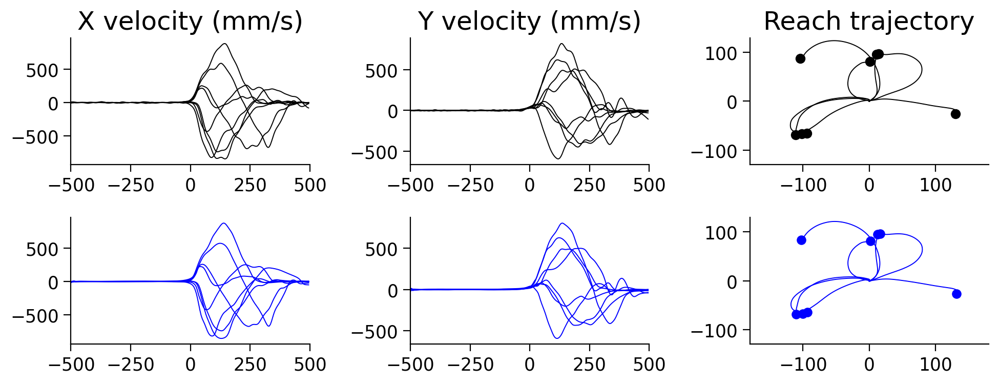

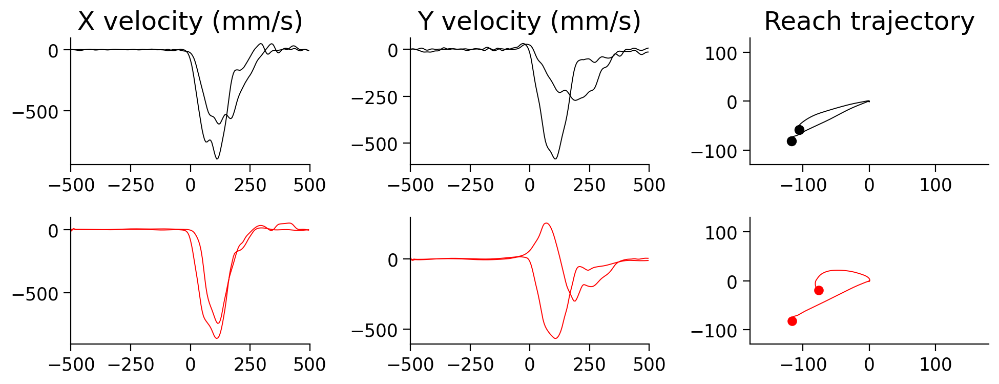

In [ ]:
0## Plot predicted vs true kinematics

# Choose 23rd condition to plot
cond = conds[0]
# Extract the trial index that corspond to the selected condition
mask = np.all(dataset.trial_info[['trial_type', 'trial_version']] == cond, axis=1).to_numpy()

# Find trials in condition and extract data
true_data = data_dict['hand_vel']

# Training data
train_mask = mask[reg_split['train']['trial']]
# Apply condition mask on training data
true_data_train = true_data_train[train_mask][:,:,:2] # only the first two dimension is the hand velocity
pred_data_train = pred_data_train[train_mask][:,:,:2]
# Plot predicted vs true kinematics
plot_continuous_decoder(data_align_range, bin_width, true_data_train, pred_data_train)

# Testing data
test_mask = mask[reg_split['test']['trial']]
# Apply condition mask on training data
true_data_test = true_data_test[test_mask][:,:,:2] # only the first two dimension is the hand velocity
pred_data_test = pred_data_test[test_mask][:,:,:2]
# Plot predicted vs true kinematics
plot_continuous_decoder(data_align_range, bin_width, true_data_test, pred_data_test, color=['black','red'])


## Discrete Decoder (Classification)

To predict the intended movement target, the discrete decoder integrate neural activity throughout time to predict the movement target. In this case, the decoder solves a classification problem.

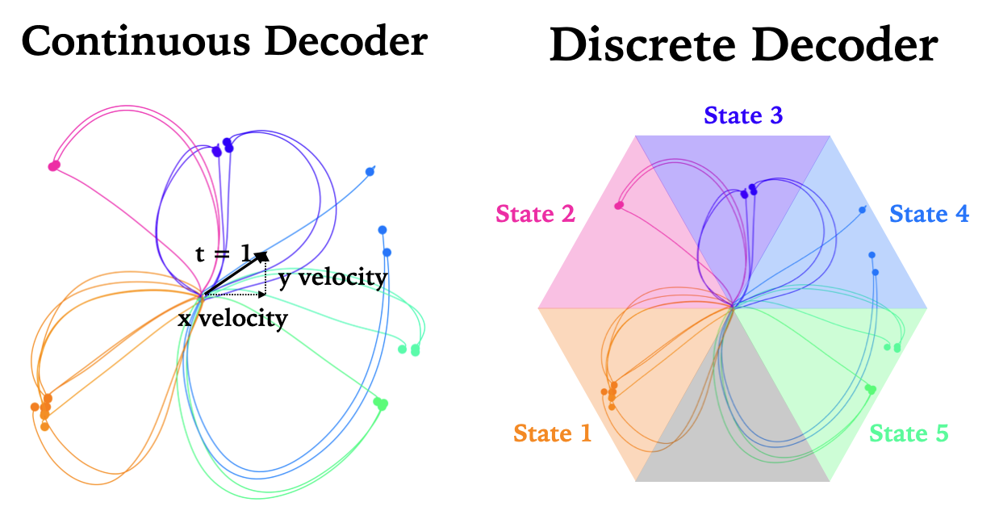

### Machine Learning Classification

### Naive Basyesian Classifier
Estimate the class probability base on class prior p(y) and estimation of the class conditioned distribution p(x|y), with naive assumption that each feature dimension is independent given the class label.

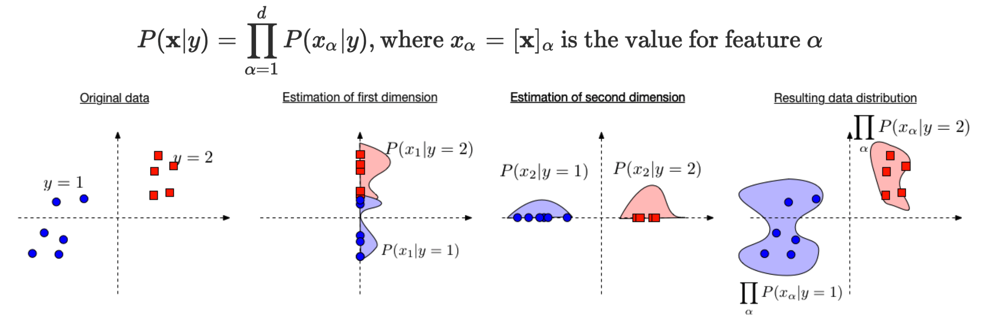

In [29]:
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score

#### Dimensionality Reduction (Bin Neural Response)

In [30]:
feat_dim = 8

nTrial, T, nNeuron = np.shape(data_dict['spikes_rate'])

# Extract neural data and lagged hand velocity
# trial_data = dataset.make_trial_data(align_field=data_align_field, align_range=data_align_range)
# lagged_trial_data = dataset.make_trial_data(align_field=data_align_field, align_range=data_align_range)
# rates = trial_data.spikes_rate.to_numpy()
# vel = lagged_trial_data.hand_vel.to_numpy()
rates_binned = np.mean(np.reshape(data_dict['spikes_rate'],(nTrial, feat_dim, T // feat_dim, -1)),2)
rates = np.reshape(rates_binned,(nTrial, -1))

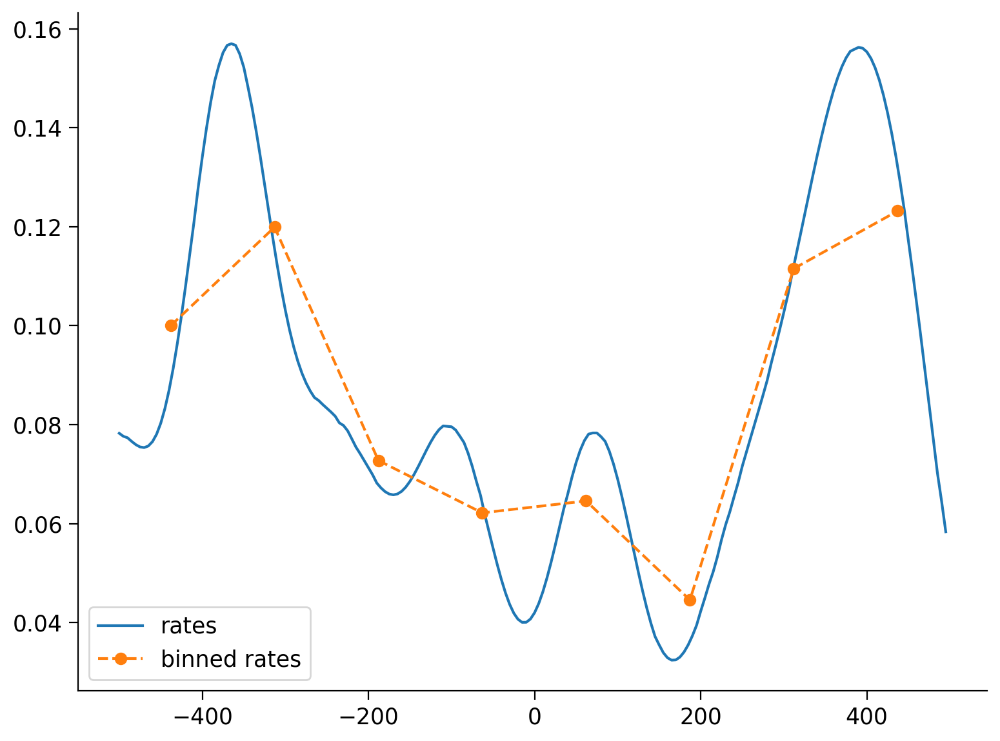

In [31]:
# Plot random neuron and random trial
neur_num = np.random.choice(nNeuron)
trial_num = np.random.choice(nTrial)

t = np.arange(data_align_range[0],data_align_range[1], bin_width)
t_binned = np.arange(data_align_range[0] + bin_width*(T // feat_dim)//2,data_align_range[1], bin_width*(T // feat_dim))

plt.plot(t,data_dict['spikes_rate'][trial_num,:,neur_num], label = "rates")
plt.plot(t_binned,rates_binned[trial_num,:,neur_num],'--o', label = "binned rates")
plt.legend()

#### Decoding targert with binned neural response

=== train Data ===
Decoding accuracy: 0.98
=== test Data ===
Decoding accuracy: 0.84


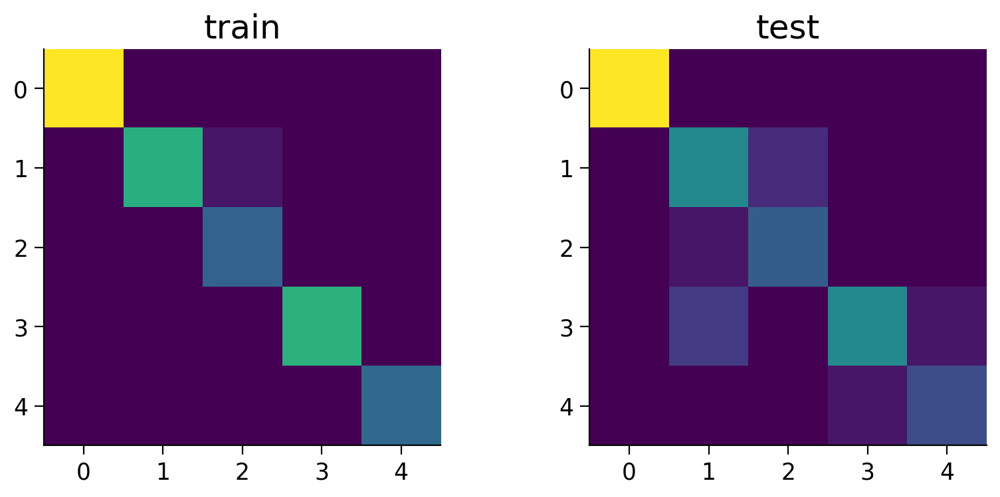

In [32]:
## target decoding

nTrial, T, _ = np.shape(data_dict['spikes_rate'])

# Train test split
cond = data_dict['cond']
data_dict['spikes_rate_binned'] = np.mean(np.reshape(data_dict['spikes_rate'],(nTrial, T // feat_dim, feat_dim, -1)),1)
clf_split = train_test_seq_split(data_dict, ['spikes_rate','spikes_rate_binned','state'], stratify=cond)

# Fit and evaluate decoder
clf = GaussianNB()
clf.fit(clf_split['train']['spikes_rate_binned_flatten'], clf_split['train']['state'])

# Initialize figure
fig, axs = plt.subplots(1,2, figsize=(10, 4))
# Discrete decoder prediction
for i, split_i in enumerate(['train', 'test']):
    clf_split[split_i]['pred_state'] = clf.predict(clf_split[split_i]['spikes_rate_binned_flatten'])
    # Compute the decoding accuacy
    print(f"=== {split_i} Data ===")
    clf_split[split_i]['acc_state'] = accuracy_score(clf_split[split_i]['state'], clf_split[split_i]['pred_state'])
    clf_split[split_i]['cm_state'] = confusion_matrix(clf_split[split_i]['state'], clf_split[split_i]['pred_state'])
    print(f"Decoding accuracy: {clf_split[split_i]['acc_state']}")
    axs[i].imshow(clf_split[split_i]['cm_state'])
    axs[i].set_title(f"{split_i}")

#### Speed-accuracy trade-off for decoding target

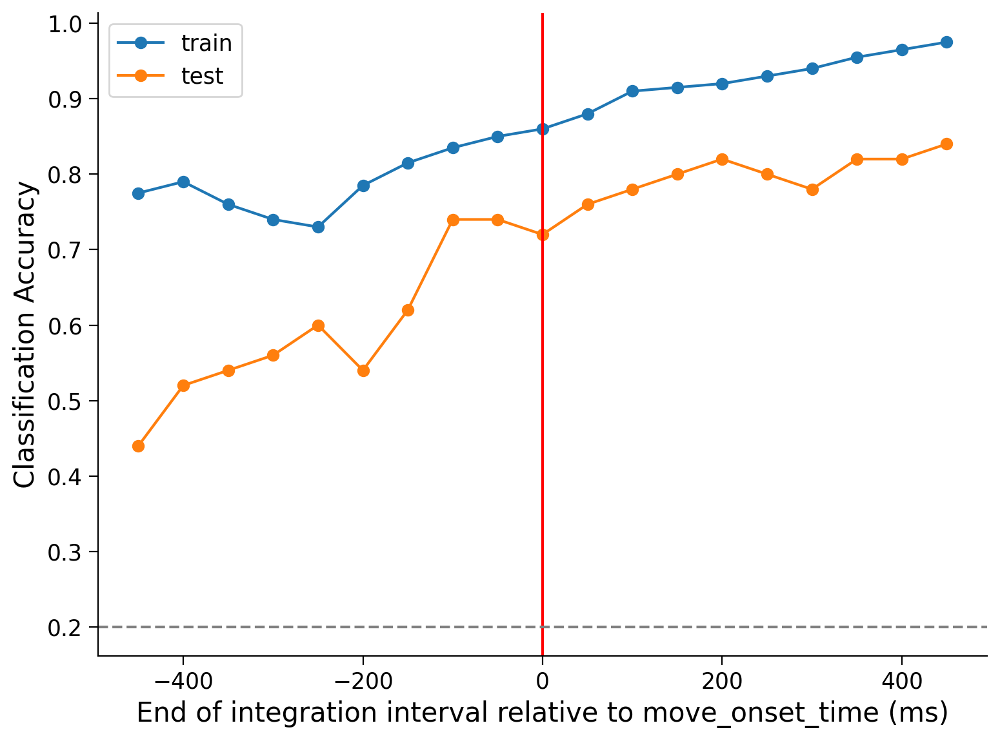

In [49]:
sample_t = range(10, T, 10)
t = np.arange(data_align_range[0], data_align_range[1], bin_width)

clf_acc_train = []
clf_acc_test = []

for t_int in sample_t:

  rates_train = np.reshape(np.mean(clf_split['train']['spikes_rate'][:,:t_int,:],1),(clf_split['train']['nTrial'], -1))
  rates_test = np.reshape(np.mean(clf_split['test']['spikes_rate'][:,:t_int,:],1),(clf_split['test']['nTrial'], -1))
  true_target_train = clf_split['train']['state']
  true_target_test = clf_split['test']['state']

  # Fit and evaluate decoder
  clf = GaussianNB()
  clf.fit(rates_train, true_target_train)
  pred_target_train = clf.predict(rates_train)
  pred_target_test = clf.predict(rates_test)

  clf_acc_train.append(accuracy_score(true_target_train, pred_target_train))
  clf_acc_test.append(accuracy_score(true_target_test, pred_target_test))

plt.plot(t[sample_t],clf_acc_train,'-o',label='train')
plt.plot(t[sample_t],clf_acc_test,'-o',label='test')
plt.axvline(0,0,1,color='r')
plt.xlabel(f'End of integration interval relative to {data_align_field} (ms)')
plt.ylabel("Classification Accuracy")
plt.legend()
plt.axhline(1/data_dict['nState'], color = 'grey',linestyle = '--')

### Neural Network Classification

#### Decoding Challenge - RNN: many-to-one

At this point, you are well-acquainted with the two primary types of neural decoding problems: the continuous decoder, which deciphers moment-to-moment movements, and the discrete decoder, tasked with decoding the reaching target from neural activity. In the preceding sections, you've witnessed the training of both machine learning (ML) and recurrent neural network (RNN) models to achieve these objectives using the MC_Maze arm-reaching dataset.

Now, in this section, you will delve into the world of many-to-one RNN classifiers, supported by the provided skeleton code.

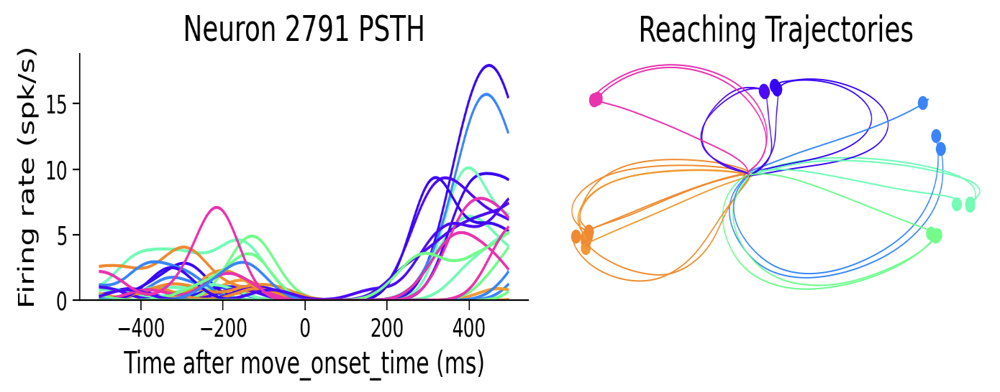

**Problem**: Classify reaching state `data_dict['state']` with neural response `data_dict['spikes_rate']`

*   **Input**: `data_dict['spikes_rate']` represent the neural spike train $[r_{1,1:T}, r_{2,1:T}, \cdots]$ recorded from $t = 1:T$
*   **Output**: `data_dict['state']` represent the state $[s_1, s_2, \cdots]$ base on `n_state = 5` discretization of the `data_dict['reach_angle'] `




In [ ]:
# @title Define RNN Model: RNNClassifier
class RNNClassifier(nn.Module):
    def __init__(self, input_size, hidden_size, layer_size, output_size):
        """
        Initialize an RNN-based classifier.

        Args:
            input_size (int): The size of the input data.
            hidden_size (int): The size of the hidden state.
            layer_size (int): The number of recurrent layers.
            output_size (int): The number of classes in the output.

        """
        super(RNNClassifier, self).__init__()
        self.input_size, self.hidden_size, self.layer_size, self.output_size = input_size, hidden_size, layer_size, output_size
        # TODO: Create the RNN layer
        self.rnn = ...
        # TODO: Create the MLP layer
        self.fc = ...

    def forward(self, x):
        """
        Forward pass through the RNN-based classifier.

        Args:
            x (torch.Tensor): Input data.

        Returns:
            output (torch.Tensor): Model's output.

        """
        # Generate initial state
        hidden_state = torch.zeros(self.layer_size, x.shape[0], self.hidden_size)
        hidden_state = hidden_state.requires_grad_()
        # TODO: Passing through the RNN layer
        output, last_hidden_state = ...
        # TODO: Passing through the MLP layer
        output = ...
        return output

In [ ]:
# @title Define RNN training procedure
def train_classifier(model, train_data, test_data, optimizer, loss_fn, num_epochs, test=True, log_every=10):
    """
    Train a classifier model.

    Args:
        model (torch.nn.Module): The classifier model to be trained.
        train_data (torch.utils.data.Dataset): The training dataset.
        test_data (torch.utils.data.Dataset): The testing dataset.
        optimizer (torch.optim.Optimizer): The optimizer used for training.
        loss_fn (torch.nn.Module): The loss function used for training.
        num_epochs (int): The number of training epochs.
        test (bool, optional): Whether to perform testing during training (default: True).
        log_every (int, optional): Interval for logging training progress (default: 10).

    Returns:
        losses (list): List of training losses for each epoch.
        train_acc_list (list): List of training accuracies for each epoch.
        test_acc_list (list): List of testing accuracies for each epoch (empty if test=False).
    """
    model.train()
    losses = []
    train_acc_list = []
    test_acc_list = []
    # pbar will plot the progress bar during training
    with trange(num_epochs, unit="batches") as pbar:
        pbar.set_description(f"Training Progress")
        # TODO: transfer the data into dataloader
        train_loader = ...
        test_loader = ...
        for epoch in pbar:
            # train model
            model.train()
            train_acc = 0
            train_loss = 0

            for j, (input, y) in enumerate(train_loader):  # load train data
                # Step ①: Perform the forward pass of the model
                y_hat = ...
                # Step ②: get the loss for the current batch
                loss = ...
                # Step ③: Clear the gradient buffers of the optimized parameters.
                # Otherwise, gradients from the previous batch would be accumulated.
                ...
                # Step ④: compute the gradient
                ...
                # Step ⑤: propagate the weight update
                ...

                train_loss += loss.item()
                # Track the training loss
                if epoch % log_every == 0:
                    # TODO: compute the training accuracy base on train label y
                    # and predicted label y_hat
                    train_acc += ...
            losses.append(train_loss / (j + 1))

            # Evaluate the model after training log_every epochs
            if epoch % log_every == 0:
                if test:
                    with torch.no_grad():
                        model.eval()
                        test_acc = 0
                        for k, (input, y) in enumerate(test_loader):
                            y_hat = model(input)
                            test_acc += accuracy_score(y_hat.argmax(dim=1), y)

                    # Add some information in the progress bar
                    pbar.set_postfix(test_acc=test_acc / (k + 1))
                    test_acc_list.append(test_acc / (k + 1))
                    train_acc_list.append(train_acc / (j + 1))
                else:
                    pbar.set_postfix(loss=train_loss / (j + 1))
    return losses, train_acc_list, test_acc_list


In [ ]:
# @title RNNClassifier prediction helper function
def rnn_classifier_prediction(train_loader, model):
    """
    Get predictions from an RNN classifier model.

    Args:
        train_loader (torch.utils.data.DataLoader): DataLoader for the training data.
        model (torch.nn.Module): The trained RNN classifier model.

    Returns:
        numpy.ndarray: True data labels.
        numpy.ndarray: Predicted data labels.

    """
    true_data = []
    pred_data = []
    with torch.no_grad():
        # TODO: set the model to evaluation mode
        ...
        for input, y in train_loader:  # load train data
            # TODO: get the prediction from each batch
            y_hat = ...
            true_data.append(y)
            # TODO: convert estimation of class probabilities to labels
            pred_data.append(...)

    true_data = np.concatenate(true_data, axis=0)
    pred_data = np.concatenate(pred_data, axis=0)

    return true_data, pred_data


In [ ]:
# @title Prepare the Train and Test Dataset

# TODO: Train and test dataset split
# Note: use `stratify = cond` ensure that all reaching directions are presented in the training data
cond = data_dict['cond']
RNNclf_split  = ...

# Convert data to appopriate datatype
train_data = RNNclf_split['train']['spikes_rate'].astype(np.float32)
train_targets = RNNclf_split['train']['state'].squeeze().astype(np.int64) # labels should be long type
test_data = RNNclf_split['test']['spikes_rate'].astype(np.float32)
test_targets = RNNclf_split['test']['state'].squeeze().astype(np.int64)

# TODO: Build training and testing dataset with TensorDataset
train_data = TensorDataset(...)
test_data = TensorDataset(...)

TypeError: ignored

In [ ]:
# @title Define the parameter and start training
# Define the hyperparameters
batch_size = 20
learning_rate = 0.001
num_epochs = 100
hidden_size = 128
layer_size = 1 # we usually only use one layer size for RNN

# Other parameters
input_size = data_dict['spikes_rate'].shape[-1]
output_size = len(np.unique(data_dict['state'])) # output size should be the number of classes. The model will output the possibility of each class in each dimension of output, and the final prediction is made based on the largest prediction
log_every = 10 # intervals to test the training accuracy

# TODO: Define the model, optimizer and loss function
# Note: regression and classification problem require different loss functions
rnn_classifier = ...
optimizer = ...
loss_fn = ...

# Train the RNNClassifier
# Note: because training can be random, you may need to run this several times to get a good classifier
losses, train_acc_list, test_acc_list = train_classifier(rnn_classifier, train_data, test_data, optimizer, loss_fn, num_epochs, log_every)



AttributeError: ignored

💡**Thinking Bubble** | What's different between the RNNRegressor hyerparameter set and the RNNClassifier hyperparameter set?

AttributeError: ignored

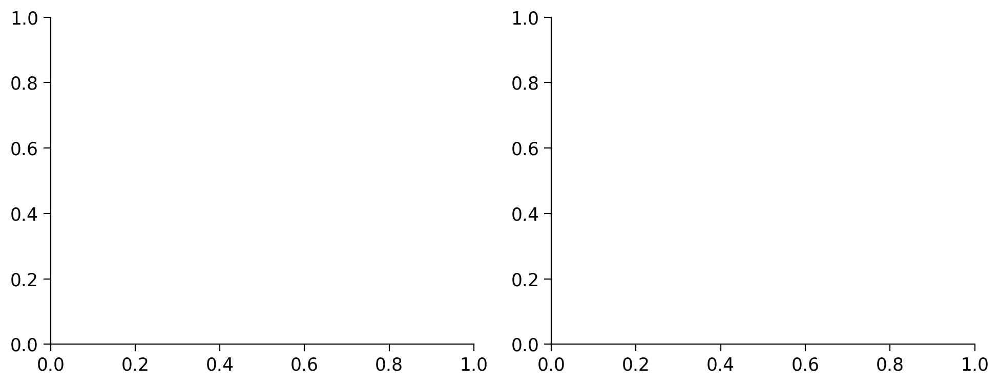

In [ ]:
# @title: Evaluate the target decoding

# Initialize figure
fig, axs = plt.subplots(1,2, figsize=(10, 4))
classifier_data = {}
classifier_data['train'] = train_data
classifier_data['test'] = test_data
clf_result = {}
clf_result['train'] = {}
clf_result['test'] = {}
# Discrete decoder prediction
for i, split_i in enumerate(['train', 'test']):
    true, pred = rnn_classifier_prediction(DataLoader(classifier_data[split_i], batch_size=batch_size, shuffle=False), rnn_classifier)
    # Compute the decoding accuacy
    print(f"=== {split_i} Data ===")
    clf_result[split_i]['acc_state'] = ...
    clf_result[split_i]['cm_state'] = ...
    print(f"Decoding accuracy: {clf_result[split_i]['acc_state']}")
    axs[i].imshow(clf_result[split_i]['cm_state'])
    axs[i].set_title(f"{split_i}")

#### Solution to the Decoding Challenge

In [ ]:
class RNNClassifier(nn.Module):
    def __init__(self, input_size, hidden_size, layer_size, output_size):
        """
        Initialize an RNN-based classifier.

        Args:
            input_size (int): The size of the input data.
            hidden_size (int): The size of the hidden state.
            layer_size (int): The number of recurrent layers.
            output_size (int): The number of classes in the output.

        """
        super(RNNClassifier, self).__init__()
        self.input_size, self.hidden_size, self.layer_size, self.output_size = input_size, hidden_size, layer_size, output_size
        # Create RNN
        self.rnn = nn.RNN(input_size, hidden_size, layer_size, batch_first=True, bias=True, nonlinearity='tanh')
        # Create fully connected layer
        self.fc = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        """
        Forward pass through the RNN-based classifier.

        Args:
            x (torch.Tensor): Input data.

        Returns:
            torch.Tensor: Model's output.

        """
        # Generate initial state
        hidden_state = torch.zeros(self.layer_size, x.shape[0], self.hidden_size)
        hidden_state = hidden_state.requires_grad_()
        output, last_hidden_state = self.rnn(x, hidden_state)
        output = self.fc(output[:, -1, :])  # Use only the last time step for prediction
        return output

In [ ]:
def train_classifier(model, train_data, test_data, optimizer, loss_fn, num_epochs, test=True, log_every=10):
    """
    Train a classifier model.

    Args:
        model (torch.nn.Module): The classifier model to be trained.
        train_data (torch.utils.data.Dataset): The training dataset.
        test_data (torch.utils.data.Dataset): The testing dataset.
        optimizer (torch.optim.Optimizer): The optimizer used for training.
        loss_fn (torch.nn.Module): The loss function used for training.
        num_epochs (int): The number of training epochs.
        test (bool, optional): Whether to perform testing during training (default: True).
        log_every (int, optional): Interval for logging training progress (default: 10).

    Returns:
        losses (list): List of training losses for each epoch.
        train_acc_list (list): List of training accuracies for each epoch.
        test_acc_list (list): List of testing accuracies for each epoch (empty if test=False).
    """
    model.train()
    losses = []
    train_acc_list = []
    test_acc_list = []
    # pbar will plot the progress bar during training
    with trange(num_epochs, unit="batches") as pbar:
        pbar.set_description(f"Training Progress")
        # transfer the data into dataloader
        train_loader = torch.utils.data.DataLoader(dataset=train_data, batch_size=batch_size, shuffle=True, drop_last=True)
        test_loader = torch.utils.data.DataLoader(dataset=test_data, batch_size=batch_size, shuffle=True, drop_last=True)
        for epoch in pbar:
            # train model
            model.train()
            train_acc = 0
            train_loss = 0
            for j, (input, y) in enumerate(train_loader):  # load train data

                # Step ①: Perform the forward pass of the model
                y_hat = model(input)
                # Step ②: get the loss for the current batch
                loss = loss_fn(y_hat, y)
                # Step ③: Clear the gradient buffers of the optimized parameters.
                # Otherwise, gradients from the previous batch would be accumulated.
                optimizer.zero_grad()
                # Step ④: compute the gradient
                loss.backward()
                # Step ⑤: propagate the weight update
                optimizer.step()

                train_loss += loss.item()
                # Track the training loss
                if epoch % log_every == 0:
                    train_acc += accuracy_score(y_hat.argmax(dim=1), y)
            losses.append(train_loss / (j + 1))

            # Evaluate the model after training log_every epochs
            if epoch % log_every == 0:
                if test:
                    with torch.no_grad():
                        model.eval()
                        test_acc = 0
                        for k, (input, y) in enumerate(test_loader):
                            y_hat = model(input)
                            test_acc += accuracy_score(y_hat.argmax(dim=1), y)

                    # Add some information in the progress bar
                    pbar.set_postfix(test_acc=test_acc / (k + 1))
                    test_acc_list.append(test_acc / (k + 1))
                    train_acc_list.append(train_acc / (j + 1))
                else:
                    pbar.set_postfix(loss=train_loss / (j + 1))
    return losses, train_acc_list, test_acc_list


In [ ]:
# define a function to get the prediction of the model
def rnn_classifier_prediction(train_loader, model):
  true_data = []
  pred_data = []
  with torch.no_grad():
    model.eval()
    for input, y in train_loader: # load train data
      y_hat = model(input) # get the prediction from each batch
      true_data.append(y)
      pred_data.append(y_hat.argmax(dim=1))

  true_data = np.concatenate(true_data, axis=0)
  pred_data = np.concatenate(pred_data, axis=0)

  return true_data, pred_data

In [ ]:
# Train test split
cond = data_dict['cond']
RNNclf_split  = train_test_seq_split(data_dict, ['spikes_rate','state'], stratify=cond)
train_data = RNNclf_split['train']['spikes_rate'].astype(np.float32)
# our data's label begins with 1, so need to transfer it into labels begin with 0
train_targets = RNNclf_split['train']['state'].squeeze().astype(np.int64) # labels should be long type
test_data = RNNclf_split['test']['spikes_rate'].astype(np.float32)
test_targets = RNNclf_split['test']['state'].squeeze().astype(np.int64)
train_data = TensorDataset(torch.from_numpy(train_data), torch.from_numpy(train_targets))
test_data = TensorDataset(torch.from_numpy(test_data), torch.from_numpy(test_targets))

In [ ]:
# Define the hyperparameters
batch_size = 20
learning_rate = 0.001
num_epochs = 100
hidden_size = 128
layer_size = 1 # we usually only use one layer size for RNN

# Other parameters
input_size = data_dict['spikes_rate'].shape[-1]
output_size = len(np.unique(data_dict['state'])) # output size should be the number of classes. The model will output the possibility of each class in each dimension of output, and the final prediction is made based on the largest prediction
log_every = 10 # intervals to test the training accuracy

# Define the modek, optimizer and loss function
rnn_classifier = RNNClassifier(input_size, hidden_size, layer_size, output_size)
optimizer = torch.optim.AdamW(rnn_classifier.parameters(), lr=learning_rate)
loss_fn = nn.CrossEntropyLoss() # widely used loss for classification

# Train the RNNClassifier
# Note: because training can be random, you may need to run this several times to get a good classifier
losses, train_acc_list, test_acc_list = train_classifier(rnn_classifier, train_data, test_data, optimizer, loss_fn, num_epochs, log_every)



Training Progress:   0%|          | 0/100 [00:00<?, ?batches/s]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:   1%|          | 1/100 [00:05<09:32,  5.78s/batches, test_acc=0.6]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:   2%|▏         | 2/100 [00:08<06:24,  3.93s/batches, test_acc=0.6]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:   3%|▎         | 3/100 [00:09<03:54,  2.41s/batches, test_acc=0.6]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:   4%|▍         | 4/100 [00:09<02:44,  1.71s/batches, test_acc=0.6]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:   5%|▌         | 5/100 [00:10<02:05,  1.32s/batches, test_acc=0.6]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:   6%|▌         | 6/100 [00:11<01:57,  1.25s/batches, test_acc=0.6]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:   7%|▋         | 7/100 [00:14<03:03,  1.97s/batches, test_acc=0.6]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:   8%|▊         | 8/100 [00:16<03:04,  2.01s/batches, test_acc=0.6]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:   9%|▉         | 9/100 [00:17<02:27,  1.62s/batches, test_acc=0.6]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])

Training Progress:  10%|█         | 10/100 [00:18<02:00,  1.34s/batches, test_acc=0.6]


torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  11%|█         | 11/100 [00:19<01:44,  1.18s/batches, test_acc=0.825]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  12%|█▏        | 12/100 [00:19<01:31,  1.04s/batches, test_acc=0.825]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  13%|█▎        | 13/100 [00:20<01:22,  1.06batches/s, test_acc=0.825]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  14%|█▍        | 14/100 [00:21<01:17,  1.12batches/s, test_acc=0.825]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])

Training Progress:  15%|█▌        | 15/100 [00:22<01:07,  1.25batches/s, test_acc=0.825]


torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  16%|█▌        | 16/100 [00:22<01:03,  1.32batches/s, test_acc=0.825]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  17%|█▋        | 17/100 [00:23<01:11,  1.16batches/s, test_acc=0.825]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  18%|█▊        | 18/100 [00:25<01:26,  1.06s/batches, test_acc=0.825]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  19%|█▉        | 19/100 [00:26<01:32,  1.14s/batches, test_acc=0.825]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  20%|██        | 20/100 [00:28<01:45,  1.32s/batches, test_acc=0.825]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  21%|██        | 21/100 [00:30<01:59,  1.51s/batches, test_acc=0.875]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  22%|██▏       | 22/100 [00:33<02:28,  1.90s/batches, test_acc=0.875]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  23%|██▎       | 23/100 [00:35<02:39,  2.07s/batches, test_acc=0.875]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  24%|██▍       | 24/100 [00:37<02:30,  1.98s/batches, test_acc=0.875]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  25%|██▌       | 25/100 [00:38<02:13,  1.78s/batches, test_acc=0.875]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  26%|██▌       | 26/100 [00:39<01:52,  1.51s/batches, test_acc=0.875]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  27%|██▋       | 27/100 [00:40<01:34,  1.30s/batches, test_acc=0.875]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  28%|██▊       | 28/100 [00:41<01:25,  1.19s/batches, test_acc=0.875]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  29%|██▉       | 29/100 [00:42<01:15,  1.07s/batches, test_acc=0.875]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  30%|███       | 30/100 [00:42<01:08,  1.02batches/s, test_acc=0.875]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  31%|███       | 31/100 [00:43<01:03,  1.09batches/s, test_acc=0.8]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  32%|███▏      | 32/100 [00:44<01:04,  1.05batches/s, test_acc=0.8]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  33%|███▎      | 33/100 [00:46<01:13,  1.09s/batches, test_acc=0.8]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  34%|███▍      | 34/100 [00:47<01:16,  1.16s/batches, test_acc=0.8]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  35%|███▌      | 35/100 [00:48<01:17,  1.19s/batches, test_acc=0.8]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  36%|███▌      | 36/100 [00:49<01:06,  1.04s/batches, test_acc=0.8]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  37%|███▋      | 37/100 [00:50<00:57,  1.09batches/s, test_acc=0.8]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  38%|███▊      | 38/100 [00:50<00:47,  1.30batches/s, test_acc=0.8]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  39%|███▉      | 39/100 [00:50<00:40,  1.52batches/s, test_acc=0.8]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  40%|████      | 40/100 [00:51<00:35,  1.70batches/s, test_acc=0.8]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  41%|████      | 41/100 [00:51<00:32,  1.84batches/s, test_acc=0.925]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  42%|████▏     | 42/100 [00:52<00:29,  1.97batches/s, test_acc=0.925]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  43%|████▎     | 43/100 [00:52<00:27,  2.08batches/s, test_acc=0.925]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  44%|████▍     | 44/100 [00:52<00:25,  2.18batches/s, test_acc=0.925]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  45%|████▌     | 45/100 [00:53<00:24,  2.24batches/s, test_acc=0.925]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  46%|████▌     | 46/100 [00:53<00:23,  2.29batches/s, test_acc=0.925]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  47%|████▋     | 47/100 [00:54<00:23,  2.29batches/s, test_acc=0.925]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  48%|████▊     | 48/100 [00:54<00:22,  2.33batches/s, test_acc=0.925]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  49%|████▉     | 49/100 [00:55<00:21,  2.35batches/s, test_acc=0.925]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  50%|█████     | 50/100 [00:55<00:21,  2.34batches/s, test_acc=0.925]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  51%|█████     | 51/100 [00:55<00:21,  2.31batches/s, test_acc=0.85]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  52%|█████▏    | 52/100 [00:56<00:20,  2.32batches/s, test_acc=0.85]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  53%|█████▎    | 53/100 [00:56<00:20,  2.35batches/s, test_acc=0.85]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  54%|█████▍    | 54/100 [00:57<00:19,  2.37batches/s, test_acc=0.85]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  55%|█████▌    | 55/100 [00:57<00:18,  2.37batches/s, test_acc=0.85]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  56%|█████▌    | 56/100 [00:58<00:18,  2.38batches/s, test_acc=0.85]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  57%|█████▋    | 57/100 [00:58<00:18,  2.39batches/s, test_acc=0.85]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  58%|█████▊    | 58/100 [00:58<00:17,  2.41batches/s, test_acc=0.85]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  59%|█████▉    | 59/100 [00:59<00:16,  2.44batches/s, test_acc=0.85]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  60%|██████    | 60/100 [00:59<00:16,  2.43batches/s, test_acc=0.85]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  61%|██████    | 61/100 [01:00<00:17,  2.22batches/s, test_acc=0.9]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  62%|██████▏   | 62/100 [01:00<00:19,  1.96batches/s, test_acc=0.9]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  63%|██████▎   | 63/100 [01:01<00:20,  1.82batches/s, test_acc=0.9]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  64%|██████▍   | 64/100 [01:02<00:20,  1.73batches/s, test_acc=0.9]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  65%|██████▌   | 65/100 [01:02<00:21,  1.64batches/s, test_acc=0.9]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  66%|██████▌   | 66/100 [01:03<00:21,  1.59batches/s, test_acc=0.9]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  67%|██████▋   | 67/100 [01:04<00:20,  1.57batches/s, test_acc=0.9]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  68%|██████▊   | 68/100 [01:04<00:20,  1.55batches/s, test_acc=0.9]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  69%|██████▉   | 69/100 [01:05<00:19,  1.55batches/s, test_acc=0.9]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  70%|███████   | 70/100 [01:06<00:19,  1.56batches/s, test_acc=0.9]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  71%|███████   | 71/100 [01:06<00:16,  1.71batches/s, test_acc=0.85]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  72%|███████▏  | 72/100 [01:06<00:15,  1.86batches/s, test_acc=0.85]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  73%|███████▎  | 73/100 [01:07<00:13,  2.00batches/s, test_acc=0.85]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  74%|███████▍  | 74/100 [01:07<00:12,  2.10batches/s, test_acc=0.85]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  75%|███████▌  | 75/100 [01:08<00:11,  2.17batches/s, test_acc=0.85]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  76%|███████▌  | 76/100 [01:08<00:10,  2.24batches/s, test_acc=0.85]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  77%|███████▋  | 77/100 [01:09<00:10,  2.27batches/s, test_acc=0.85]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  78%|███████▊  | 78/100 [01:09<00:09,  2.32batches/s, test_acc=0.85]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  79%|███████▉  | 79/100 [01:09<00:09,  2.33batches/s, test_acc=0.85]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  80%|████████  | 80/100 [01:10<00:08,  2.33batches/s, test_acc=0.85]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  81%|████████  | 81/100 [01:10<00:08,  2.26batches/s, test_acc=0.95]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  82%|████████▏ | 82/100 [01:11<00:07,  2.32batches/s, test_acc=0.95]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  83%|████████▎ | 83/100 [01:11<00:07,  2.37batches/s, test_acc=0.95]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  84%|████████▍ | 84/100 [01:12<00:06,  2.37batches/s, test_acc=0.95]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  85%|████████▌ | 85/100 [01:12<00:06,  2.39batches/s, test_acc=0.95]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  86%|████████▌ | 86/100 [01:12<00:05,  2.41batches/s, test_acc=0.95]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  87%|████████▋ | 87/100 [01:13<00:05,  2.42batches/s, test_acc=0.95]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  88%|████████▊ | 88/100 [01:13<00:05,  2.39batches/s, test_acc=0.95]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  89%|████████▉ | 89/100 [01:14<00:04,  2.35batches/s, test_acc=0.95]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  90%|█████████ | 90/100 [01:14<00:04,  2.36batches/s, test_acc=0.95]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  91%|█████████ | 91/100 [01:15<00:03,  2.27batches/s, test_acc=0.925]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  92%|█████████▏| 92/100 [01:15<00:03,  2.29batches/s, test_acc=0.925]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  93%|█████████▎| 93/100 [01:15<00:03,  2.30batches/s, test_acc=0.925]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  94%|█████████▍| 94/100 [01:16<00:02,  2.08batches/s, test_acc=0.925]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  95%|█████████▌| 95/100 [01:17<00:02,  1.87batches/s, test_acc=0.925]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  96%|█████████▌| 96/100 [01:17<00:02,  1.76batches/s, test_acc=0.925]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  97%|█████████▋| 97/100 [01:18<00:01,  1.67batches/s, test_acc=0.925]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  98%|█████████▊| 98/100 [01:19<00:01,  1.61batches/s, test_acc=0.925]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress:  99%|█████████▉| 99/100 [01:19<00:00,  1.56batches/s, test_acc=0.925]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


Training Progress: 100%|██████████| 100/100 [01:20<00:00,  1.24batches/s, test_acc=0.925]

torch.Size([20])
torch.Size([20, 4])
torch.Size([20])
torch.Size([20, 4])


=== train Data ===
Decoding accuracy: 1.0
=== test Data ===
Decoding accuracy: 0.98


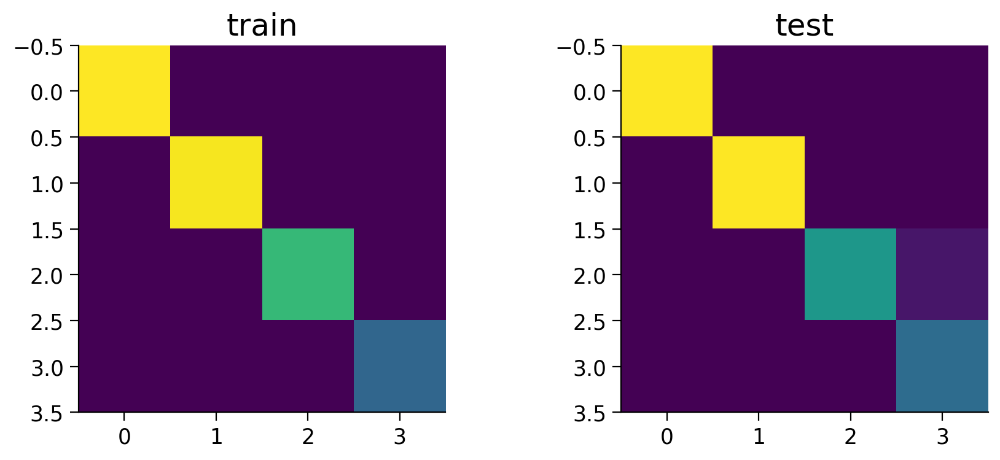

In [ ]:
## target decoding

nTrial, T, _ = np.shape(data_dict['spikes_rate'])

# Initialize figure
fig, axs = plt.subplots(1,2, figsize=(10, 4))
classifier_data = {}
classifier_data['train'] = train_data
classifier_data['test'] = test_data
clf_result = {}
clf_result['train'] = {}
clf_result['test'] = {}
# Discrete decoder prediction
for i, split_i in enumerate(['train', 'test']):
    true, pred = rnn_classifier_prediction(DataLoader(classifier_data[split_i], batch_size=batch_size, shuffle=False), rnn_classifier)
    # Compute the decoding accuacy
    print(f"=== {split_i} Data ===")
    clf_result[split_i]['acc_state'] = accuracy_score(true, pred)
    clf_result[split_i]['cm_state'] = confusion_matrix(true, pred)
    print(f"Decoding accuracy: {clf_result[split_i]['acc_state']}")
    axs[i].imshow(clf_result[split_i]['cm_state'])
    axs[i].set_title(f"{split_i}")

In [ ]:
# optimizer and loss function
rnn_classifier = RNNClassifier(input_size, hidden_size, layer_size, output_size)
optimizer = torch.optim.AdamW(rnn_classifier.parameters(), lr=learning_rate)
loss_fn = nn.CrossEntropyLoss() # widely used loss for classification
# because training can be random, you may need to run this several times to get a good classifier
losses, train_acc_list, test_acc_list = train_classifier(rnn_classifier, train_data, test_data, optimizer, loss_fn, num_epochs, log_every)

NameError: ignored

#### Evaluate the Model performance

In [ ]:
# students' job
# define a function to get the prediction of the model
def rnn_classifier_prediction(train_loader, model):
  true_data = []
  pred_data = []
  with torch.no_grad():
    model.eval()

    #

  return true_data, pred_data

In [ ]:
# TODO: target decoding

nTrial, T, _ = np.shape(data_dict['spikes_rate'])

# Initialize figure
fig, axs = plt.subplots(1,2, figsize=(10, 4))
classifier_data = {}
classifier_data['train'] = train_data
classifier_data['test'] = test_data
clf_result = {}
clf_result['train'] = {}
clf_result['test'] = {}
# Discrete decoder prediction
for i, split_i in enumerate(['train', 'test']):
    # get the true and predicted label from rnn_classifier_prediction function
    # Compute the decoding accuacy
    print(f"=== {split_i} Data ===")
    # use accuracy_score to get accuracy
    # use confusion_matrix to get a confusion matrix

    print(f"Decoding accuracy: {clf_result[split_i]['acc_state']}")
    axs[i].imshow(clf_result[split_i]['cm_state'])
    axs[i].set_title(f"{split_i}")

# Summary: Neural Decoding Problem for MC_Maze

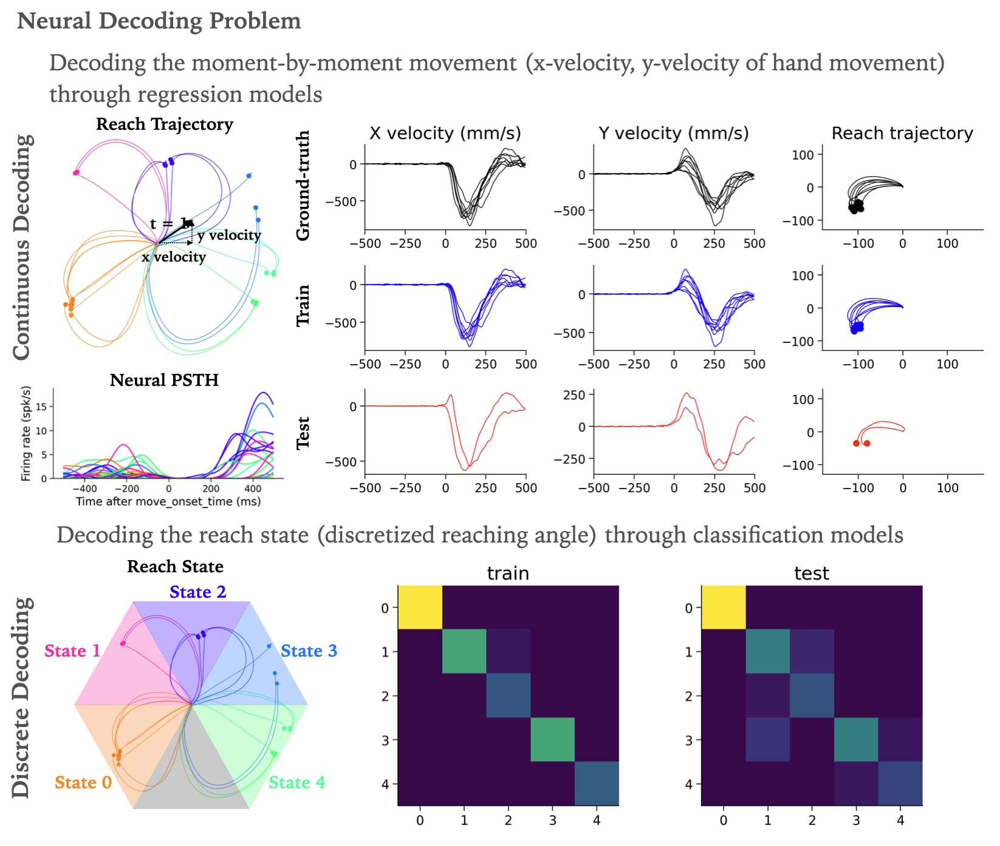

# Bonus: Neural Trajectories

Latent variable models (LVM) are a powerful approach for characterizing the internal state of biological neural networks based on partial observations of the neuronal population. Specifically LVM descrbe observed neural activity as a combination of latent variables, which are often fewer than the number of observed neurons and typically exhibit an orderly progression in time. Look-up [Neural Latent Benchmark](https://neurallatents.github.io/) for comparsion and evaluation of multiple LVMs.

In [12]:
# @title Parameter: Dimensionality of the latent state
latent_dim = 2


In [52]:
# @title Dimensionality Reduction with PCA
nCond, T, nNeur = np.shape(data_dict['psth'])

rate_scaled = StandardScaler().fit_transform(np.reshape(data_dict['psth'],(nCond * T, nNeur)))
pca = PCA(n_components=latent_dim)
data_dict['neur_traj_flatten'] = pca.fit_transform(rate_scaled)
data_dict['neur_traj'] = np.reshape(data_dict['neur_traj_flatten'], (nCond , T, latent_dim))

NameError: ignored

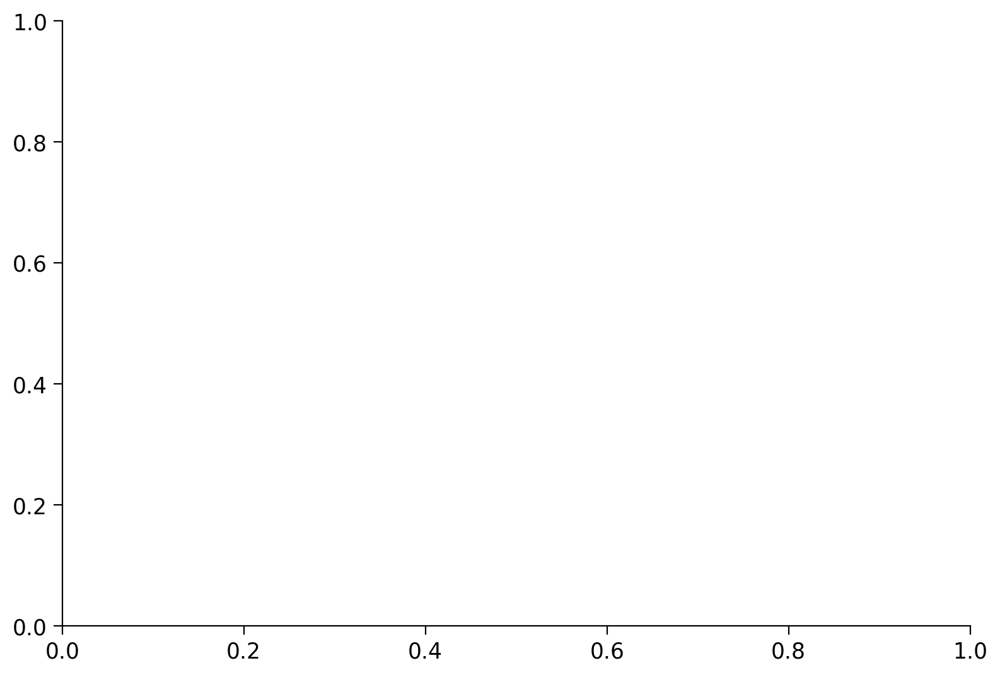

In [53]:
# @title Visualization of the Latent State

# Loop through trajectories and plot
fig = plt.figure(figsize=(9, 6))

if latent_dim == 2:
    ax = fig.add_axes([0.1, 0.1, 0.8, 0.8])
    for traj, col in zip(data_dict['neur_traj'], data_dict['trial_colors']):
        ax.plot(traj[:, 0], traj[:, 1], color=col)
        ax.scatter(traj[0, 0], traj[0, 1], color=col)

    # Add labels
    ax.set_xlabel('PC1')
    ax.set_ylabel('PC2')
elif latent_dim == 3:
    ax = fig.add_subplot(111, projection='3d')
    for traj, col in zip(data_dict['neur_traj'], data_dict['trial_colors']):
        ax.plot(traj[:, 0], traj[:, 1], traj[:, 2], color=col)
        ax.scatter(traj[0, 0], traj[0, 1], traj[0, 2], color=col)

    # Add labels
    ax.set_xlabel('PC1')
    ax.set_ylabel('PC2')
    ax.set_zlabel('PC3')
plt.show()
plt.axis('off')

💡  **Thinking Bubble**: If we consider those low dimensional latent trajectories (de-noised neural firing rate) as neural feature, could we improve neural decoder (continuous decoder / discrete decoder) performance?

# Summary

In this tutorial, you learned about formulate the neural decoding problem for brain machine interface application through demonstration of the delayed arm reaching dataset.

Specifically, we covered:
*   introduced the MC_Maze dataset, describing the task and provided data
*   List item

